In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
from PIL import Image
import shap

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader

c:\Users\Owner\anaconda3\envs\pytorch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load images from folder 
def load_images_from_folder(folder, size):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename), cv2.IMREAD_GRAYSCALE)
        if img is not None and img.shape == (size, size):
            images.append(img)
    return images

real_def = load_images_from_folder('MVTEC-AD Textures/grid/test/all',1024)
masks_def = load_images_from_folder('MVTEC-AD Textures/grid/ground_truth/all',1024)

In [3]:
real_def = np.array(real_def)
masks_def = np.array(masks_def)

In [4]:
masks_def.shape

(57, 1024, 1024)

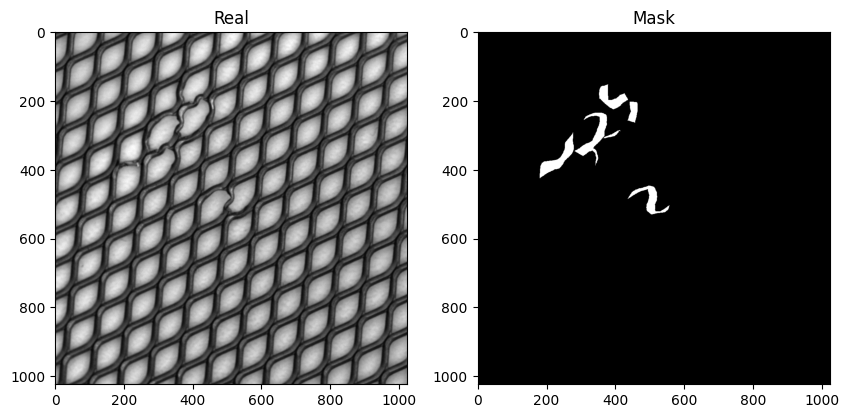

In [5]:
# plot first images in real and masks
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(real_def[1], cmap='gray')
ax[0].set_title('Real')
ax[1].imshow(masks_def[1], cmap='gray')
ax[1].set_title('Mask')
plt.show()


In [7]:
ET = np.load('EigenvectorsT.npy')

def feature_vector(patch):
    image_array = np.array(patch).flatten()
    image_vector = np.dot(ET, image_array)
    image_vector = np.reshape(image_vector, (1, -1))
    return image_vector

def_small = load_images_from_folder('grid/grid_defects_small',64)
ndef_small = load_images_from_folder('grid/grid_good_small',64)

def_small = np.array(def_small)
ndef_small = np.array(ndef_small)

In [ ]:
ET

In [8]:
# Normalize def_small and ndef_small
def_small = def_small/255.0
ndef_small = ndef_small/255.0

In [9]:
# Create augmented data with random rotations and flips
def_small_aug = []
ndef_small_aug = []
for i in range(0, len(def_small)):
    def_small_aug.append(def_small[i])
    def_small_aug.append(np.rot90(def_small[i], 1))
    def_small_aug.append(np.rot90(def_small[i], 2))
    def_small_aug.append(np.rot90(def_small[i], 3))
    def_small_aug.append(np.fliplr(def_small[i]))
    def_small_aug.append(np.flipud(def_small[i]))
    ndef_small_aug.append(ndef_small[i])
    ndef_small_aug.append(np.rot90(ndef_small[i], 1))
    ndef_small_aug.append(np.rot90(ndef_small[i], 2))
    ndef_small_aug.append(np.rot90(ndef_small[i], 3))
    ndef_small_aug.append(np.fliplr(ndef_small[i]))
    ndef_small_aug.append(np.flipud(ndef_small[i]))

def_small_aug = np.array(def_small_aug)
ndef_small_aug = np.array(ndef_small_aug)

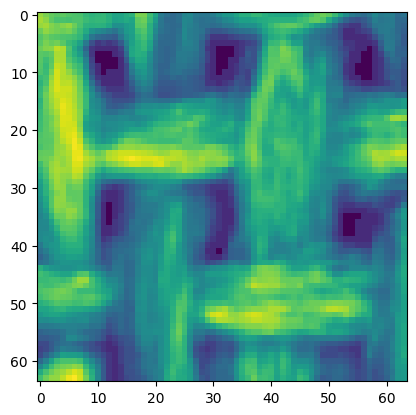

In [10]:
plt.imshow(def_small_aug[0])
plt.show()

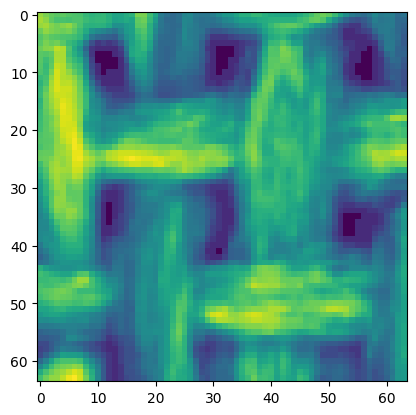

In [11]:
plt.imshow(def_small[0])
plt.show()

In [12]:
# Create feature vectors
def_small_aug_features = np.array([feature_vector(patch) for patch in def_small_aug])
ndef_small_aug_features = np.array([feature_vector(patch) for patch in ndef_small_aug])

In [13]:
# Create feature vectors for all images
def_small_features = np.array([feature_vector(patch) for patch in def_small])
ndef_small_features = np.array([feature_vector(patch) for patch in ndef_small])

In [14]:
def_small_features.shape, ndef_small_features.shape

((595, 1, 4096), (1000, 1, 4096))

In [15]:
def_small_aug_features.shape, ndef_small_aug_features.shape

((3570, 1, 4096), (3570, 1, 4096))

In [16]:
# create training and testing dataset with labels with random split of 80/20
# defects = np.concatenate((def_small_features, ndef_small_features))
defects = np.concatenate((def_small_aug_features, ndef_small_aug_features))
labels = np.concatenate((np.ones(len(def_small_aug_features)), np.zeros(len(ndef_small_aug_features))))
labels = np.reshape(labels, (-1, 1))

# Randomly shuffle the data
np.random.seed(42)
np.random.shuffle(defects)
np.random.seed(42)
np.random.shuffle(labels)

# Split into training and testing data
split = int(0.8 * len(defects))
train_features = defects[:split]
train_labels = labels[:split]
test_features = defects[split:]
test_labels = labels[split:]

In [17]:
# Reshape the data
train_features = np.reshape(train_features, (train_features.shape[0], -1))
train_labels = np.reshape(train_labels, (train_labels.shape[0], -1))
#Get one hot encoding of labels
train_labels = np.eye(2)[train_labels.astype('int32')]
test_features = np.reshape(test_features, (test_features.shape[0], -1))
test_labels = np.reshape(test_labels, (test_labels.shape[0], -1))
#Get one hot encoding of labels
test_labels = np.eye(2)[test_labels.astype('int32')]

In [18]:
train_features.shape, train_labels.shape, test_features.shape, test_labels.shape

((5712, 4096), (5712, 1, 2), (1428, 4096), (1428, 1, 2))

In [19]:
# check the class balance in the training and testing data
print("Train labels: ", np.unique(train_labels, return_counts=True))
print("Test labels: ", np.unique(test_labels, return_counts=True))

Train labels:  (array([0., 1.]), array([5712, 5712], dtype=int64))
Test labels:  (array([0., 1.]), array([1428, 1428], dtype=int64))


In [20]:
# Train a Neural Network model to classify the patches using Pytorch


# Convert numpy arrays to tensors
train_features_tensor = torch.from_numpy(train_features).float()
train_labels_tensor = torch.from_numpy(train_labels).float()
test_features_tensor = torch.from_numpy(test_features).float()
test_labels_tensor = torch.from_numpy(test_labels).float()

# Create a TensorDataset
train_ds = TensorDataset(train_features_tensor, train_labels_tensor)
test_ds = TensorDataset(test_features_tensor, test_labels_tensor)

# Create a DataLoader
train_dl = DataLoader(train_ds, batch_size=64, shuffle=True)
test_dl = DataLoader(test_ds, batch_size=64, shuffle=True)



In [21]:
# Define 1D CNN model and training using GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv1d(1, 32, 3)
        self.pool = nn.MaxPool1d(2, 2)
        self.conv2 = nn.Conv1d(32, 64, 3)
        self.fc1 = nn.Linear(64 * 1022, 128)
        self.fc2 = nn.Linear(128, 2)
        self.dropout = nn.Dropout(0.5)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        #print(x.shape)
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))   
        #print(x.shape)     
        x = x.view(-1, 64 * 1022)
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x
    
net = Net()
net.to(device)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

cuda:0


In [22]:
# Train the model
epochs = 100
train_losses = []
train_accuracies = []
test_losses = []
test_accuracies = []

for epoch in range(epochs):  # loop over the dataset multiple times
    running_loss = 0.0
    correct = 0
    total = 0
    net.train()
    for i, data in enumerate(train_dl, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs.unsqueeze(1))
        labels = labels.squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        predicted = torch.round(outputs.data)
        total += labels.size(0)
        correct += (predicted == labels).sum(axis=0)[0]
    train_losses.append(running_loss/len(train_dl))
    train_accuracies.append(100 * correct / total)
    print('Epoch: %d, Training Loss: %.3f, Training Accuracy: %.3f' % (epoch + 1, running_loss/len(train_dl), 100 * correct / total))

    # Test the model
    running_loss = 0.0
    correct = 0
    total = 0
    net.eval()
    with torch.no_grad():
        for i, data in enumerate(test_dl, 0):
            inputs, labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = net(inputs.unsqueeze(1))
            labels = labels.squeeze(1)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            predicted = torch.round(outputs.data)
            total += labels.size(0)
            correct += (predicted == labels).sum(axis=0)[0]
    test_losses.append(running_loss/len(test_dl))
    test_accuracies.append(100 * correct / total)
    print('Epoch: %d, Testing Loss: %.3f, Testing Accuracy: %.3f' % (epoch + 1, running_loss/len(test_dl), 100 * correct / total))

print('Finished Training')

Epoch: 1, Training Loss: 0.611, Training Accuracy: 66.772
Epoch: 1, Testing Loss: 0.402, Testing Accuracy: 83.403
Epoch: 2, Training Loss: 0.362, Training Accuracy: 84.314
Epoch: 2, Testing Loss: 0.250, Testing Accuracy: 90.336
Epoch: 3, Training Loss: 0.286, Training Accuracy: 87.868
Epoch: 3, Testing Loss: 0.227, Testing Accuracy: 91.106
Epoch: 4, Training Loss: 0.237, Training Accuracy: 90.301
Epoch: 4, Testing Loss: 0.188, Testing Accuracy: 92.997
Epoch: 5, Training Loss: 0.219, Training Accuracy: 91.317
Epoch: 5, Testing Loss: 0.188, Testing Accuracy: 92.437
Epoch: 6, Training Loss: 0.215, Training Accuracy: 91.737
Epoch: 6, Testing Loss: 0.175, Testing Accuracy: 92.787
Epoch: 7, Training Loss: 0.207, Training Accuracy: 91.684
Epoch: 7, Testing Loss: 0.172, Testing Accuracy: 93.557
Epoch: 8, Training Loss: 0.206, Training Accuracy: 92.139
Epoch: 8, Testing Loss: 0.161, Testing Accuracy: 93.908
Epoch: 9, Training Loss: 0.182, Training Accuracy: 92.770
Epoch: 9, Testing Loss: 0.152,

In [23]:
train_accuracies = np.array([tensor.cpu().numpy() for tensor in train_accuracies])

In [24]:
test_accuracies = np.array([tensor.cpu().numpy() for tensor in test_accuracies])

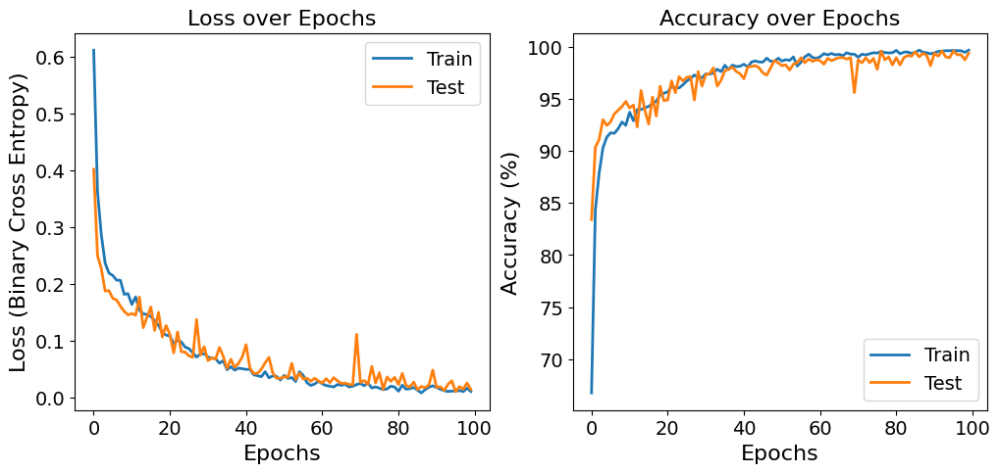

In [25]:
# Plot the losses and accuracies
plt.figure(figsize=(12, 5))

plt.rcParams['font.size'] = 14
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['legend.fontsize'] = 14

# Plot losses
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train', linewidth=2)  # Increase line width
plt.plot(test_losses, label='Test', linewidth=2)  # Increase line width
plt.xlabel('Epochs')
plt.ylabel('Loss (Binary Cross Entropy)')
plt.legend()
plt.title('Loss over Epochs')  # Set title for the first plot

# Plot accuracies
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train', linewidth=2)  # Increase line width
plt.plot(test_accuracies, label='Test', linewidth=2)  # Increase line width
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.title('Accuracy over Epochs')  # Set title for the second plot
plt.show()

In [ ]:
train_features.shape

In [ ]:
test_labels.shape

In [ ]:
# Train a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=42)
clf.fit(train_features, train_labels.reshape((9600,2)))

# Predict on test data
preds = clf.predict(test_features)
train_preds = clf.predict(train_features)

In [ ]:
# Check accuracy
from sklearn.metrics import accuracy_score
print(accuracy_score(test_labels.reshape((2400,2)), preds))
print(accuracy_score(train_labels.reshape((9600,2)), train_preds))

# Get Confusion Matrix
from sklearn.metrics import confusion_matrix
confusion_matrix(test_labels.reshape((2400,2)), preds)
confusion_matrix(train_labels.reshape((9600,2)), train_preds)

In [26]:
import numpy as np
from skimage.util import view_as_windows



# Define the function to apply to each patch
def process_patch(patch):
    # Your function here
    image_array = np.array(patch).flatten()
    image_vector = np.dot(ET, image_array)
    image_vector = np.reshape(image_vector, (1, -1))
    # Predict using trained neural network
    patch_pred = net(torch.Tensor(image_vector).to(device))
    #patch_pred = clf.predict(image_vector)
    #pred_prob = clf.predict_proba(image_vector)
    return patch_pred,image_array, image_vector #pred_prob

In [ ]:
pred_out, prob, vect = process_patch(def_small[0])
print(pred_out)
print(prob)
plt.imshow(def_small[0])
plt.show()
# Plot the vector
plt.plot(vect[0])

In [ ]:
pred_out, prob, vect = process_patch(patches[10,0])
print(pred_out)
print(prob)
plt.imshow(patches[10,0])
plt.show()
plt.plot(vect[0])

In [ ]:
real_def.shape

In [39]:
# load network to net
net = Net()
net.load_state_dict(torch.load('wood_net.pth'))
net.to(device)

Net(
  (conv1): Conv1d(1, 32, kernel_size=(3,), stride=(1,))
  (pool): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,))
  (fc1): Linear(in_features=65408, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=2, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (sigmoid): Sigmoid()
)

In [ ]:
# # save network
# torch.save(net.state_dict(), 'tile_net.pth')

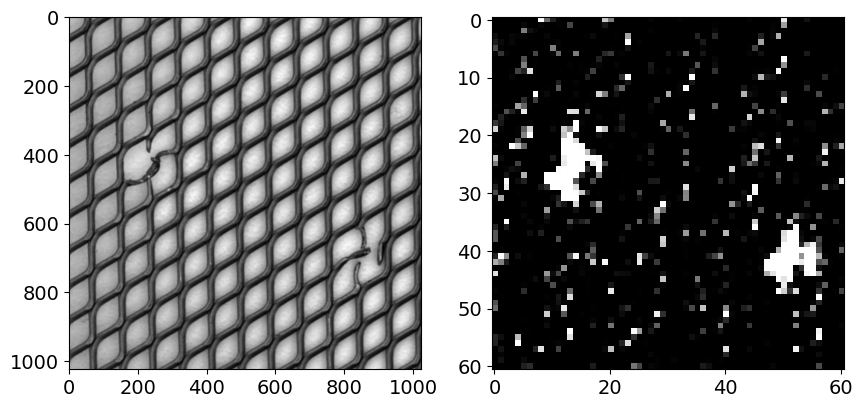

In [31]:
# Iteratite the code over all images in real_def

# Define patch size and overlap
patch_size = (64, 64)  # replace with your desired patch size
overlap = 16  # replace with your desired overlap
im = real_def[18]/255.0
# im = plt.imread('non_defects/im2_0.jpeg')
patches = view_as_windows(im, patch_size, step=overlap)
# Apply the function to each patch
processed = np.zeros_like(patches[:,:,0,0])
for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        # plt.imshow(patches[i, j])
        # plt.show()
        class_pred, class_prob, _ = process_patch(patches[i, j])
        processed[i, j] = class_pred[0][1]#class_prob[0][1]

# Plot the original and reconstructed images
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(im, cmap='gray')
ax[1].imshow(processed, cmap='gray')
plt.show()

In [32]:
processed.shape

(61, 61)

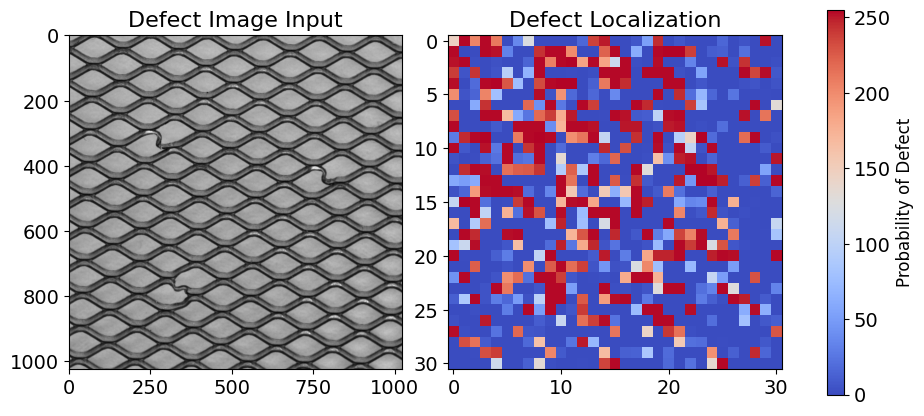

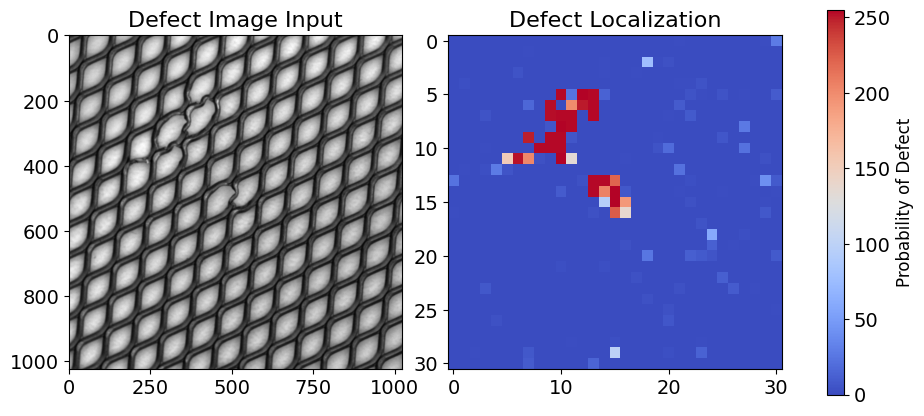

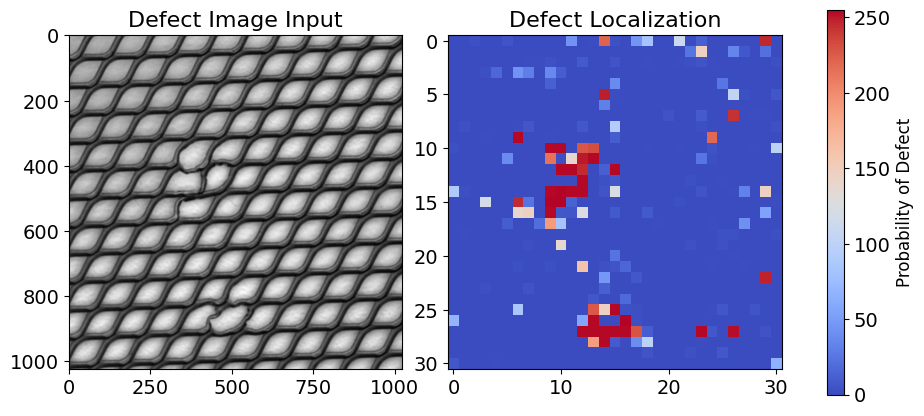

KeyboardInterrupt: 

In [28]:
patch_size = (64, 64)  # replace with your desired patch size
overlap = 32  # replace with your desired overlap

# Iterate over all images in real_def
for im_index in range(len(real_def)):
    im = real_def[im_index]/255.0

    patches = view_as_windows(im, patch_size, step=overlap)

    # Apply the function to each patch
    processed = np.zeros_like(patches[:,:,0,0])
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            class_pred, class_prob, _ = process_patch(patches[i, j])
            processed[i, j] = class_pred[0][1]

    # Save Processed Image
    processed = processed*255
    processed = processed.astype(np.uint8)
    processed = Image.fromarray(processed)
    processed.save('tile_output/tile_localization_{}.png'.format(im_index))
    

    # Plot the original and reconstructed images
    fig, ax = plt.subplots(1, 3, figsize=(10, 5), gridspec_kw={'width_ratios': [1, 1, 0.05]})
    ax[0].imshow(im, cmap='gray')
    ax[0].set_title('Defect Image Input')  # Set title for the first plot
    ax[0].set_aspect('equal')  # Set aspect to be equal
    im1 = ax[1].imshow(processed, cmap='coolwarm')  # Use 'coolwarm' colormap
    ax[1].set_title('Defect Localization')  # Set title for the second plot
    ax[1].set_aspect('equal')  # Set aspect to be equal
    cbar = fig.colorbar(im1, cax=ax[2])  # Add colorbar to the third subplot
    cbar.set_label('Probability of Defect', size=12)  # Increase font size of colorbar label
    #fig.subplots_adjust(wspace=0.1)  # Reduce the space between the plots
    plt.show()

    # Save the figure
    fig.savefig('tile_output/tile_plot_{}.png'.format(im_index), bbox_inches='tight')
    plt.close(fig)

In [33]:
# Get AUROC for each image
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
# Plot Image, Mask and AUROC score for each image
# get f1 score
f1_score_cyclegan = []

auc_pr_cyclegan = []
auroc_cyclegan = []

auroc_simplenet = []
auc_pr_simplenet = []
f1_score_simplenet = []

thresholds = np.linspace(0, 1, 100)

#processed_im = load_images_from_folder('tile_local',49)

masks = []

# resize masks_def to 49x49
for i in range(len(masks_def)):
    # Convert the image to grayscale
    masks.append((cv2.resize(masks_def[i], (61, 61), interpolation=cv2.INTER_AREA) > 0).astype(int))

In [15]:
# plot processed_im
plt.imshow(processed_im[0])
plt.show()

NameError: name 'processed_im' is not defined

In [16]:
masks = np.array(masks)
masks.shape

(89, 31, 31)

In [ ]:
segmentations = load_images_from_folder('segmentation',288)
simplenetOUT = []
for i in range(len(masks_def)):
    # Convert the image to grayscale
    simplenetOUT.append(cv2.resize(segmentations[i], (49, 49), interpolation=cv2.INTER_NEAREST))

In [ ]:
simplenetOUT = np.array(simplenetOUT)
simplenetOUT.shape

In [ ]:
simplenetOUT = simplenetOUT/255.0

AUROC (Ours):  0.9168478753284407
AUPR (Ours):  0.4044608937052935
F1 score (Ours):  0.062151394422310755


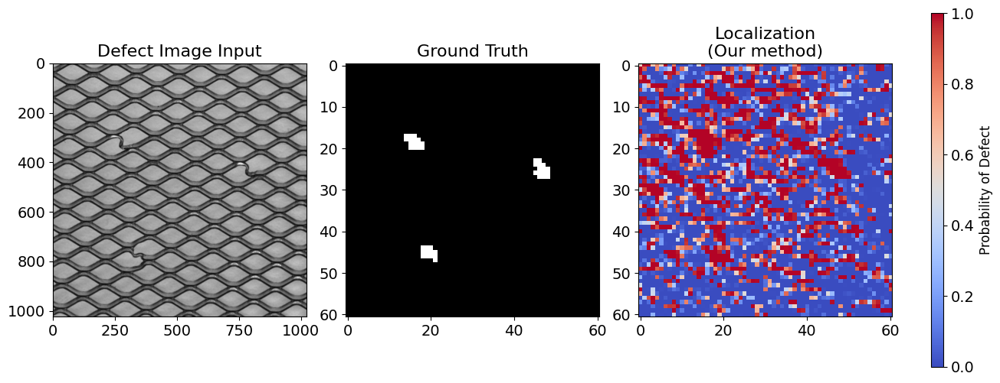

AUROC (Ours):  0.9361384345437183
AUPR (Ours):  0.5901602287963026
F1 score (Ours):  0.6323529411764706


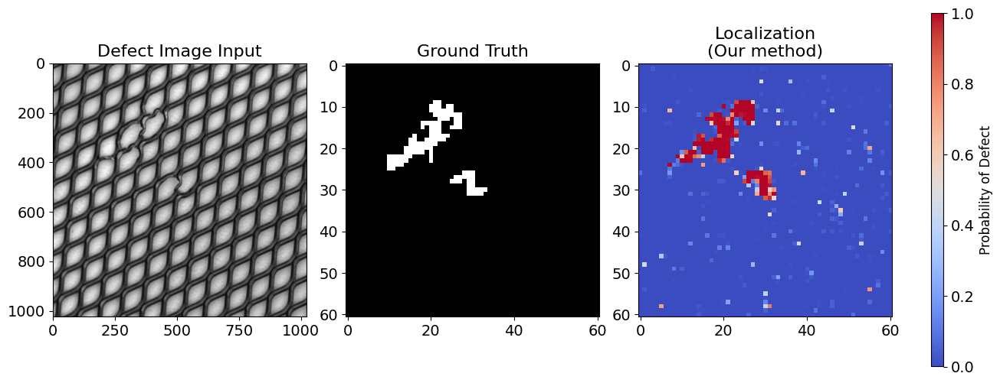

AUROC (Ours):  0.8910449568188544
AUPR (Ours):  0.43664804338136326
F1 score (Ours):  0.46645367412140576


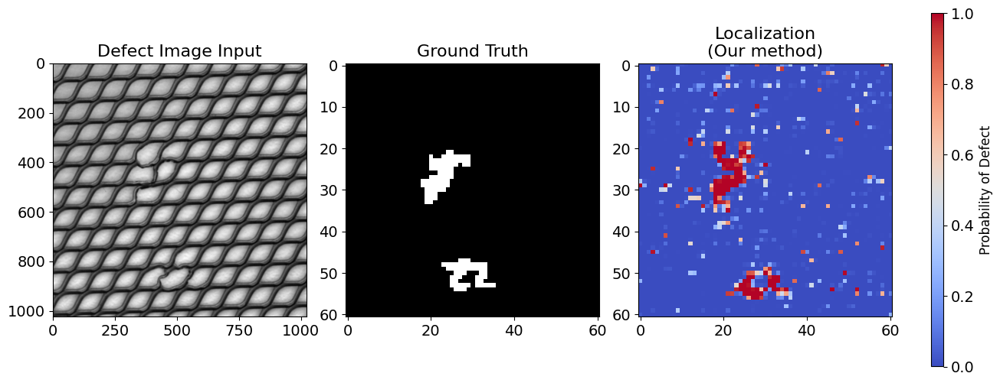

AUROC (Ours):  0.9214472246876494
AUPR (Ours):  0.6966656806491393
F1 score (Ours):  0.48615384615384616


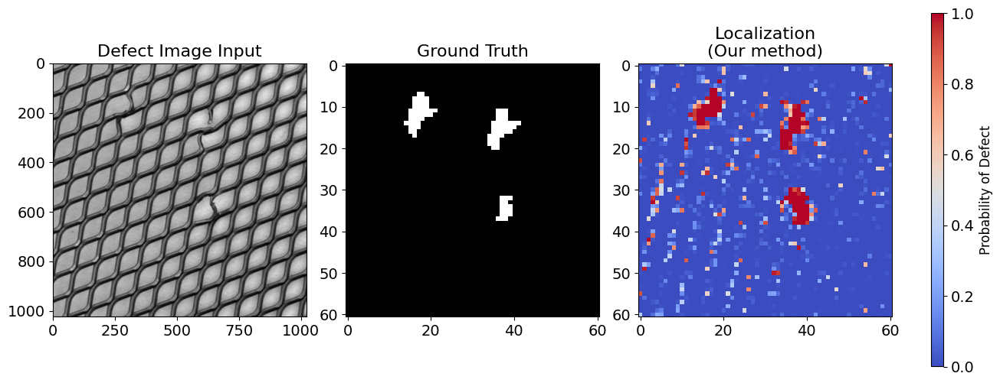

AUROC (Ours):  0.9341176386527001
AUPR (Ours):  0.35259697337627344
F1 score (Ours):  0.42222222222222217


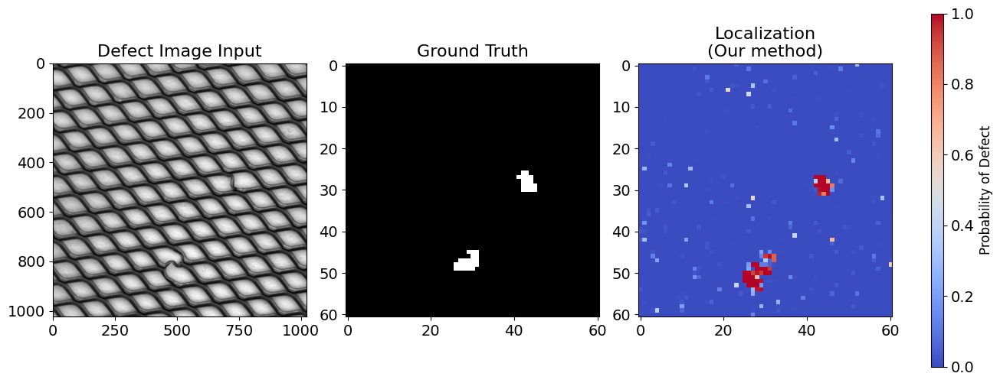

AUROC (Ours):  0.9456598292103179
AUPR (Ours):  0.3849997784509568
F1 score (Ours):  0.38461538461538464


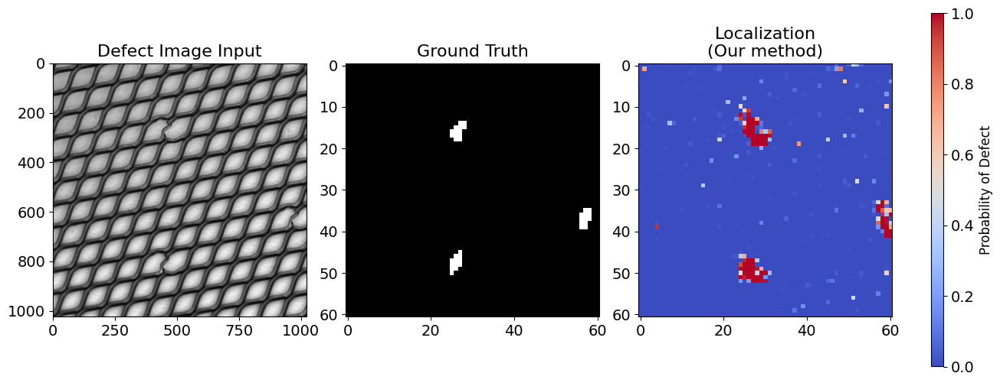

AUROC (Ours):  0.958547953204179
AUPR (Ours):  0.5705777215391389
F1 score (Ours):  0.4565916398713826


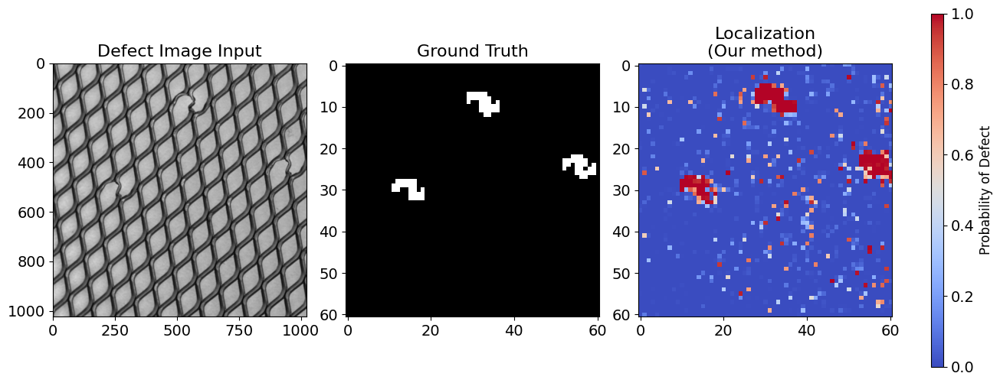

AUROC (Ours):  0.9655093858210315
AUPR (Ours):  0.6735977286927297
F1 score (Ours):  0.5414364640883977


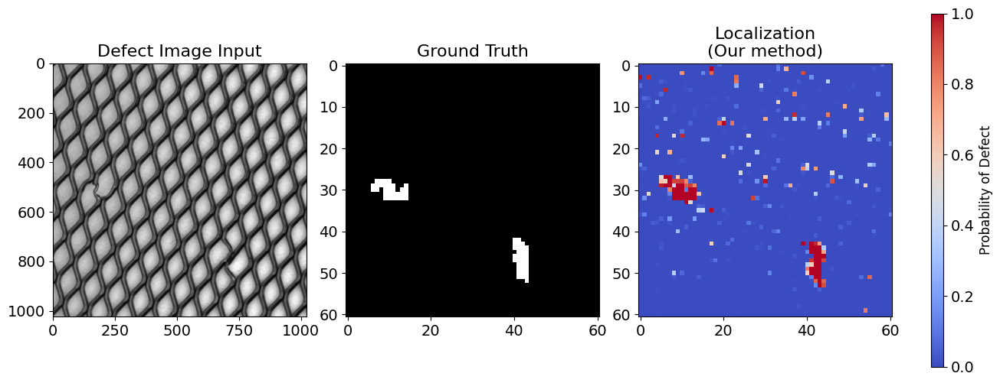

AUROC (Ours):  0.899776642082859
AUPR (Ours):  0.6028539543520908
F1 score (Ours):  0.5628140703517588


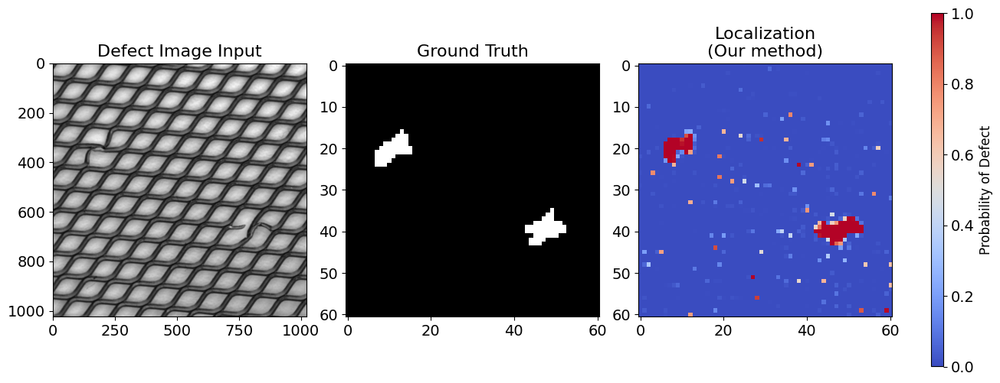

AUROC (Ours):  0.894216190535209
AUPR (Ours):  0.5217830614879079
F1 score (Ours):  0.313915857605178


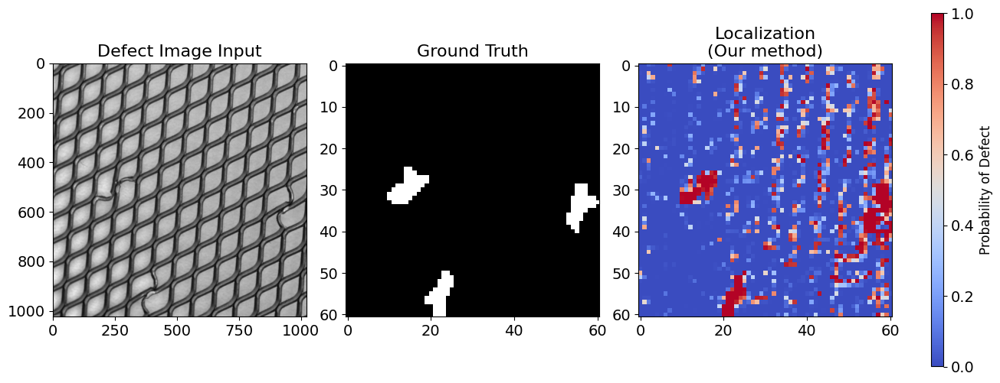

AUROC (Ours):  0.811760126234716
AUPR (Ours):  0.26057128659904666
F1 score (Ours):  0.3835616438356164


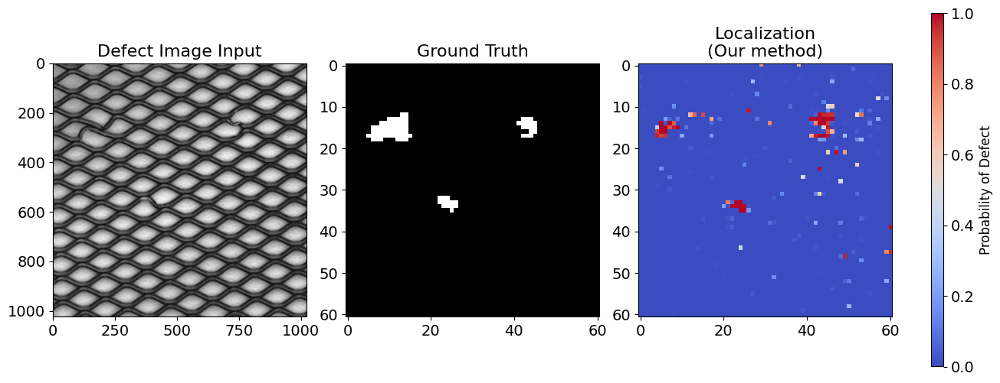

AUROC (Ours):  0.9234442140863339
AUPR (Ours):  0.429753361307952
F1 score (Ours):  0.2644628099173554


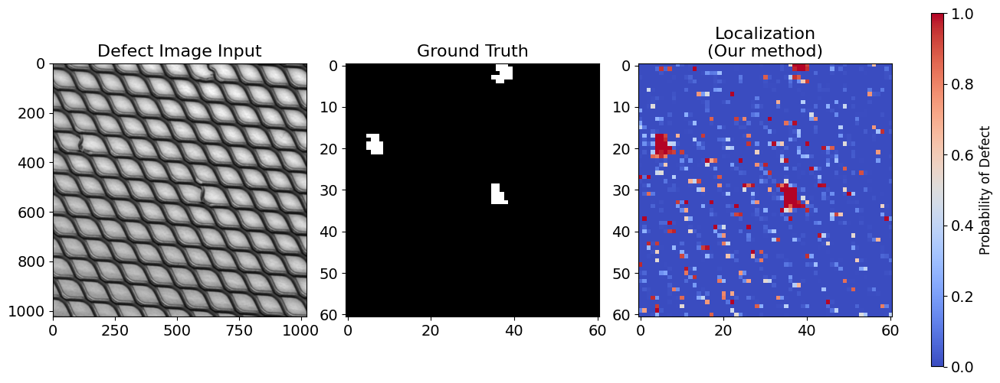

AUROC (Ours):  0.9329952058599617
AUPR (Ours):  0.5057537999651841
F1 score (Ours):  0.10479375696767


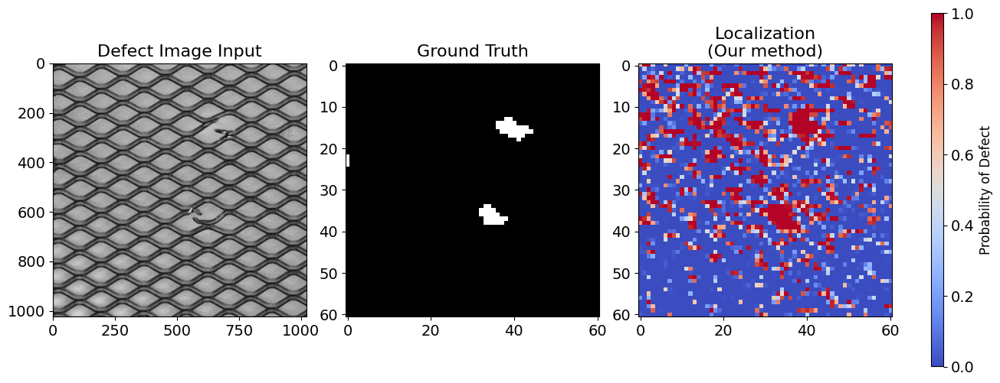

AUROC (Ours):  0.8924668464483028
AUPR (Ours):  0.18513060813388596
F1 score (Ours):  0.08711433756805807


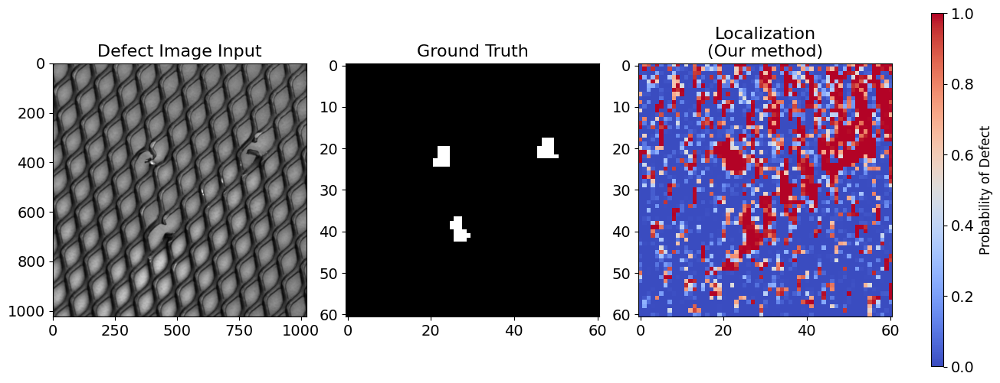

AUROC (Ours):  0.9400916888494528
AUPR (Ours):  0.5304147486456913
F1 score (Ours):  0.13712374581939799


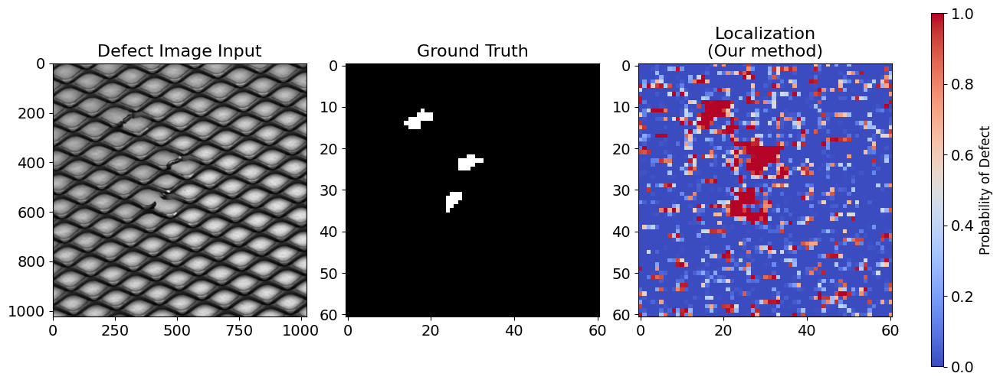

AUROC (Ours):  0.6556007839589929
AUPR (Ours):  0.09955663841952815
F1 score (Ours):  0.024163568773234202


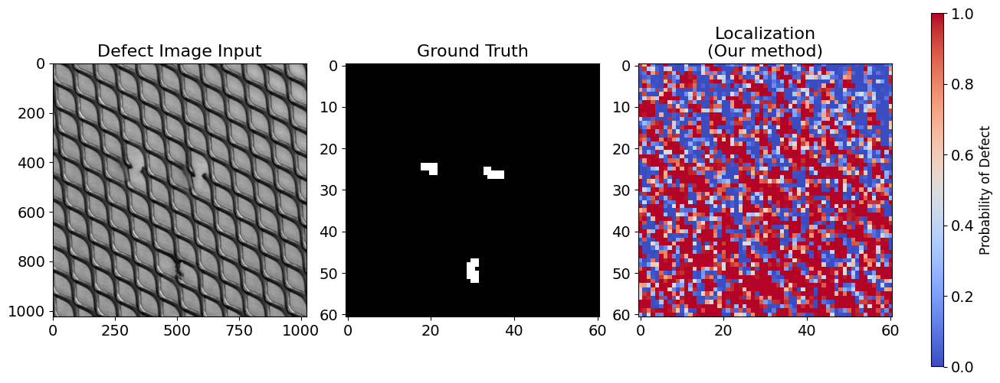

AUROC (Ours):  0.8949764811266565
AUPR (Ours):  0.6085011625645785
F1 score (Ours):  0.446078431372549


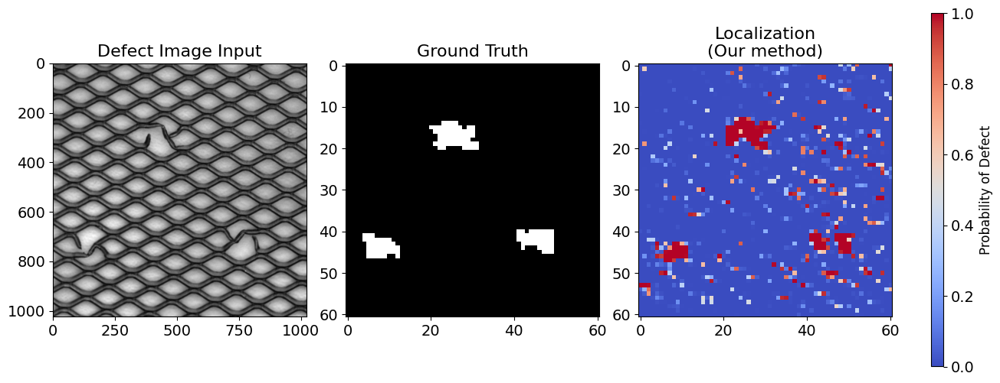

AUROC (Ours):  0.9541055341055341
AUPR (Ours):  0.5003571276368524
F1 score (Ours):  0.056296296296296296


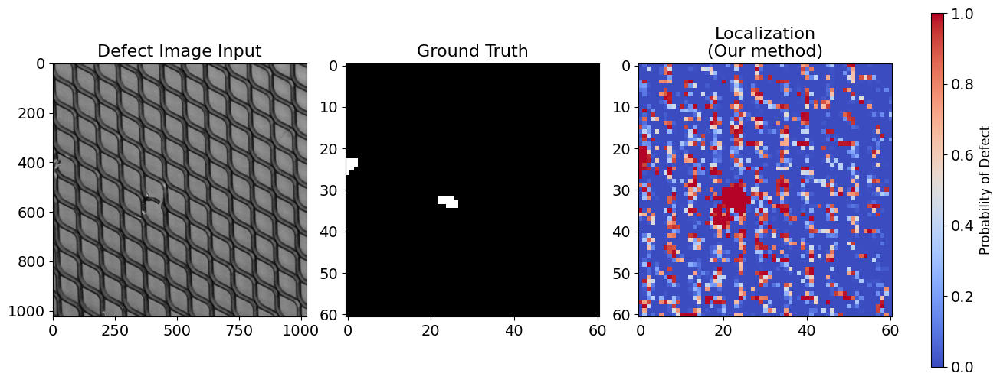

AUROC (Ours):  0.9377707047119415
AUPR (Ours):  0.5920538060308287
F1 score (Ours):  0.41486068111455116


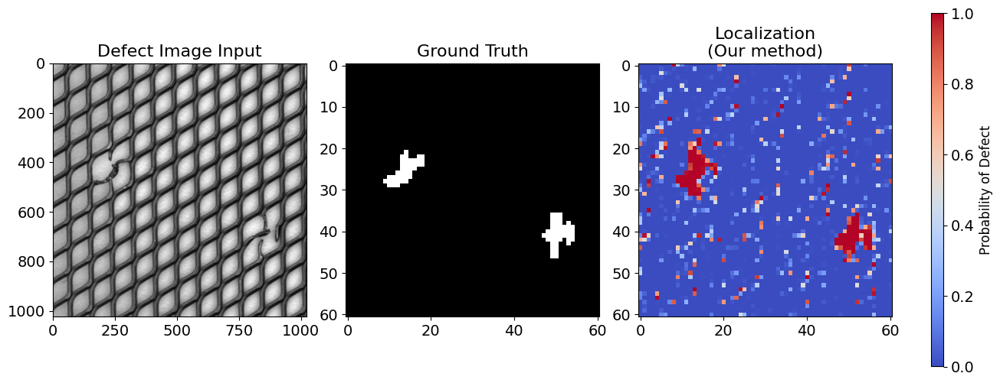

AUROC (Ours):  0.9683474670556531
AUPR (Ours):  0.47235012583679015
F1 score (Ours):  0.375


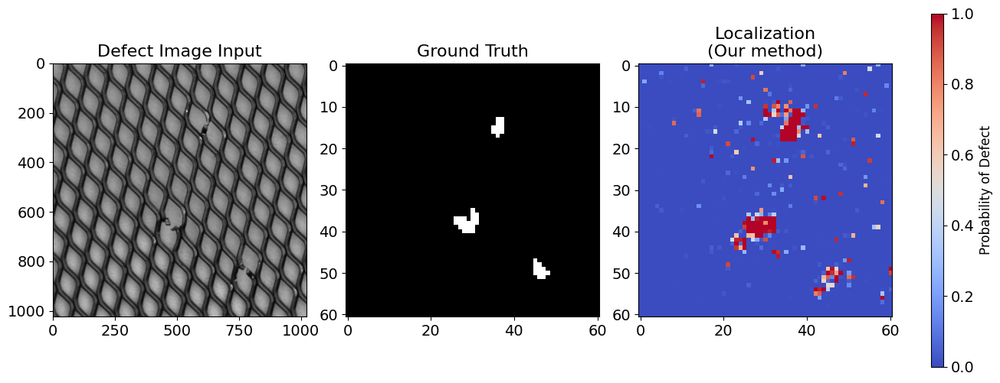

AUROC (Ours):  0.9385959288347492
AUPR (Ours):  0.48397672872908276
F1 score (Ours):  0.3669724770642202


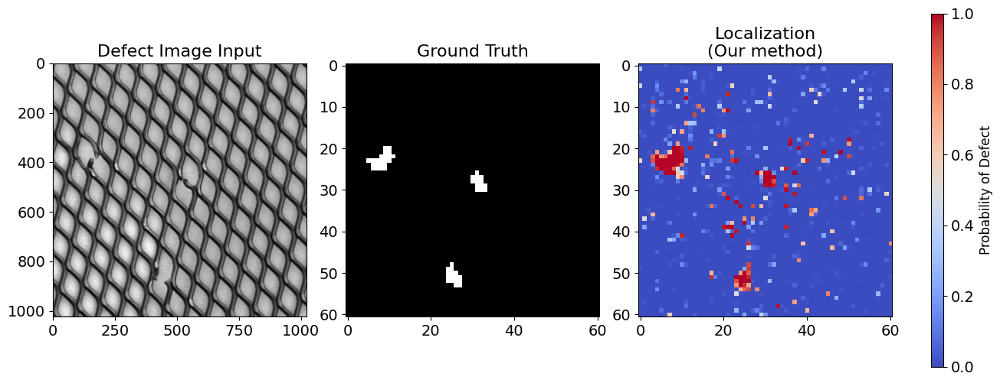

AUROC (Ours):  0.9789565953330914
AUPR (Ours):  0.6548898310699074
F1 score (Ours):  0.5467625899280576


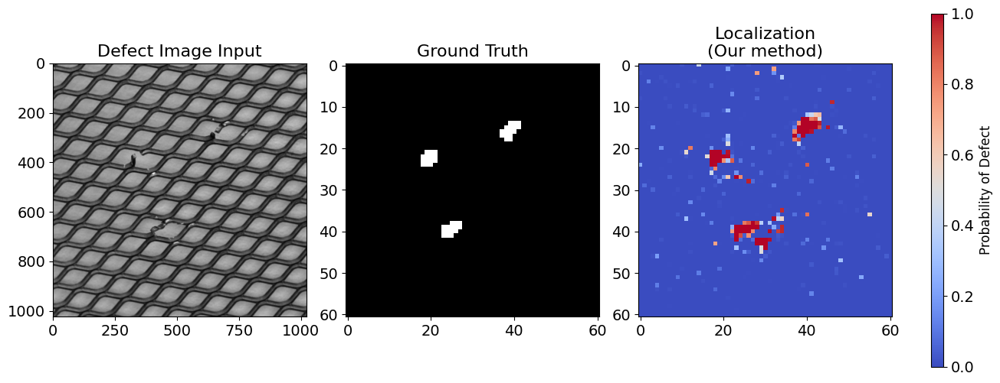

AUROC (Ours):  0.9731811180574431
AUPR (Ours):  0.40451540580698014
F1 score (Ours):  0.23780487804878042


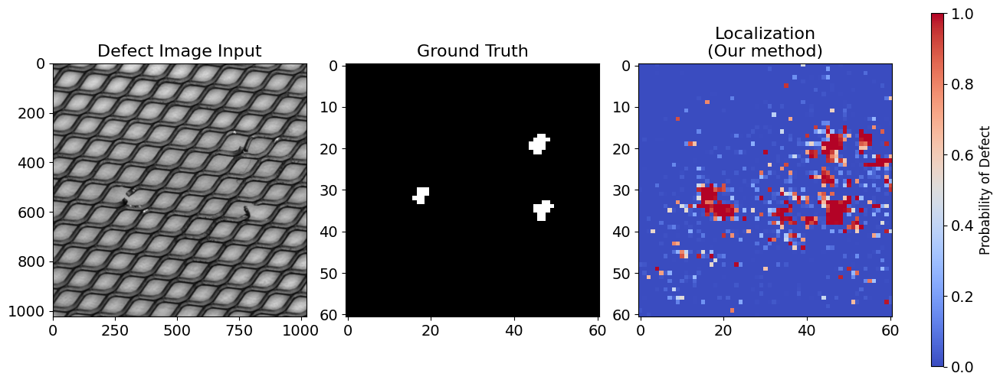

AUROC (Ours):  0.9554375629796139
AUPR (Ours):  0.33589973843311366
F1 score (Ours):  0.4615384615384615


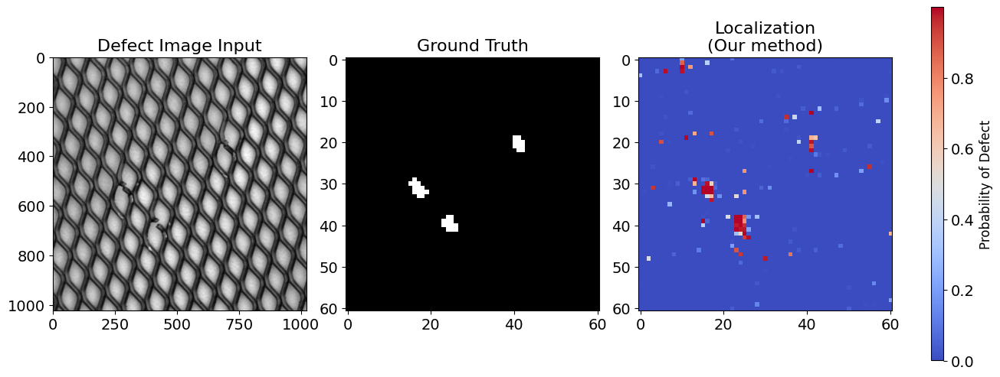

AUROC (Ours):  0.9069545783211728
AUPR (Ours):  0.45335237589018285
F1 score (Ours):  0.09090909090909091


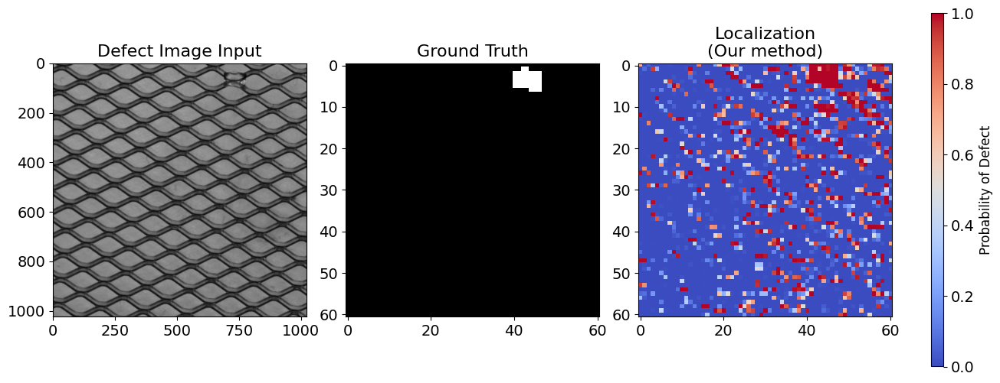

AUROC (Ours):  0.8219401596775444
AUPR (Ours):  0.2627918434314281
F1 score (Ours):  0.03932993445010925


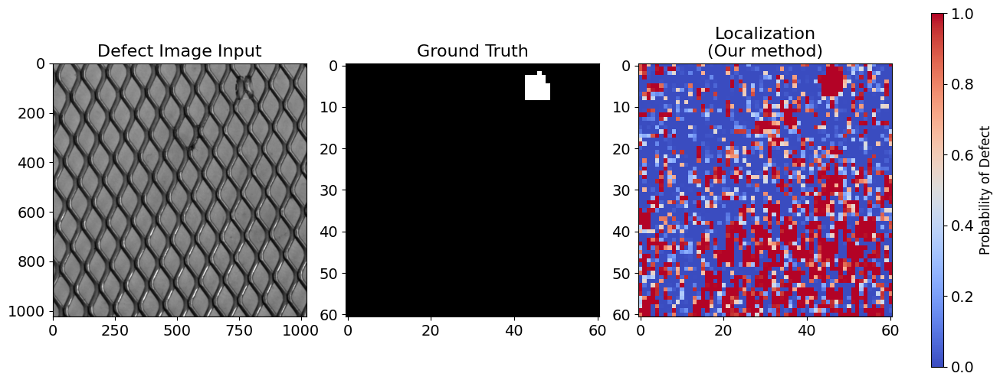

AUROC (Ours):  0.9490870346383654
AUPR (Ours):  0.6520216797660002
F1 score (Ours):  0.11352253756260433


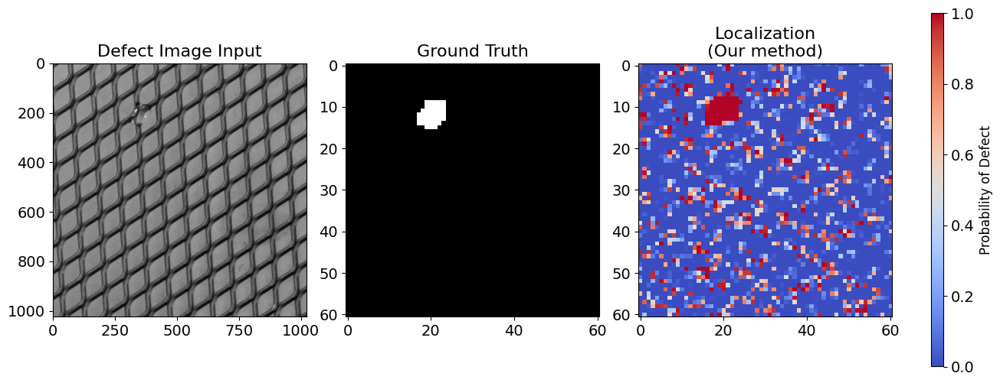

AUROC (Ours):  0.9456325573001263
AUPR (Ours):  0.3303979617230373
F1 score (Ours):  0.09160305343511449


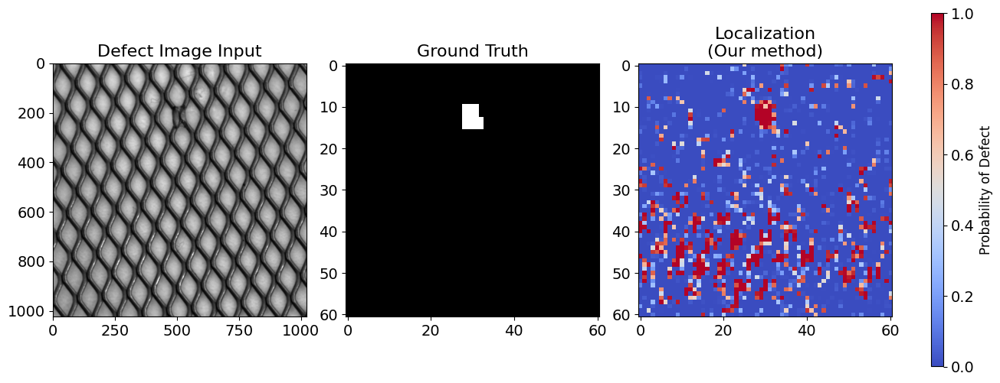

AUROC (Ours):  0.9088469271789492
AUPR (Ours):  0.43514501221048235
F1 score (Ours):  0.1827956989247312


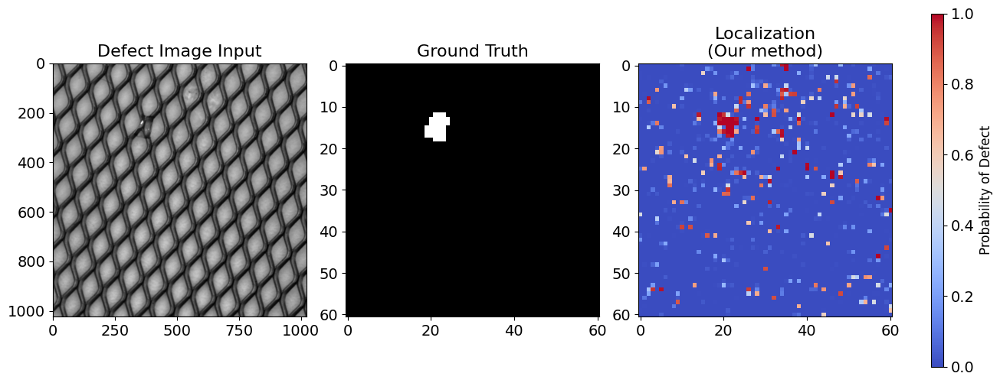

AUROC (Ours):  0.8859376813276083
AUPR (Ours):  0.30436315036670336
F1 score (Ours):  0.07375271149674621


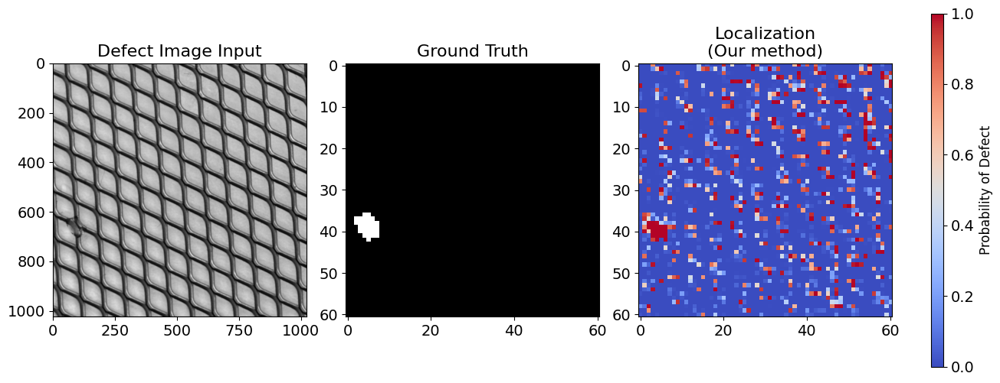

AUROC (Ours):  0.9673811612975111
AUPR (Ours):  0.7647092945405282
F1 score (Ours):  0.14634146341463417


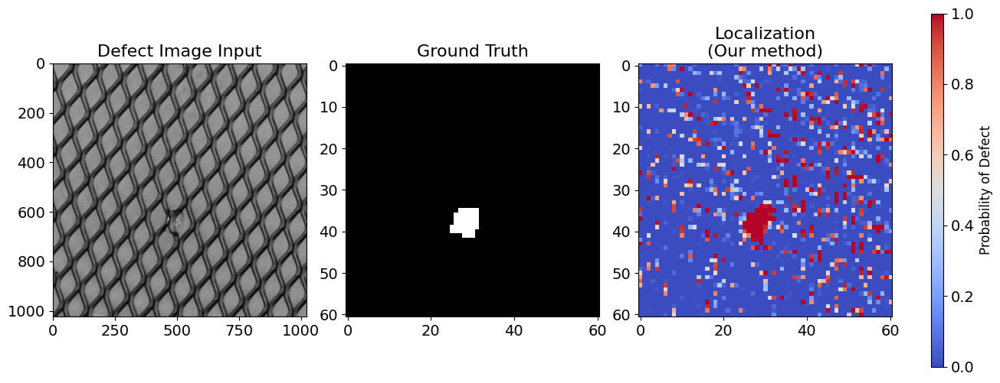

AUROC (Ours):  0.9661832474925454
AUPR (Ours):  0.4892664375641039
F1 score (Ours):  0.10580204778156997


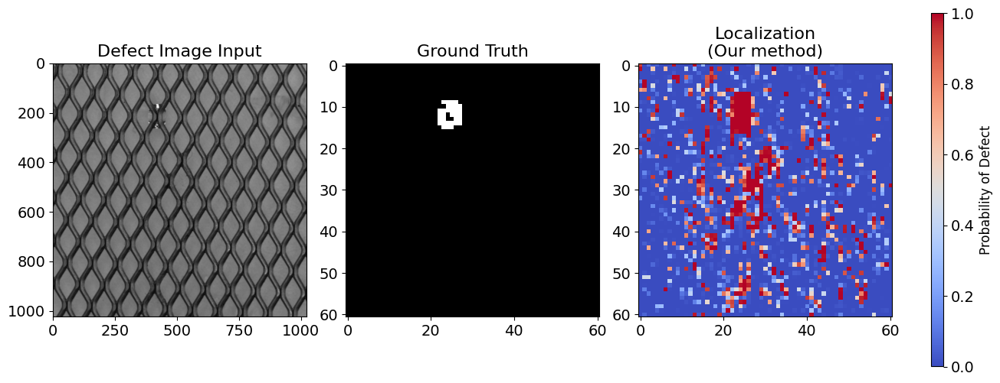

AUROC (Ours):  0.955939561651527
AUPR (Ours):  0.7058776498578744
F1 score (Ours):  0.21568627450980393


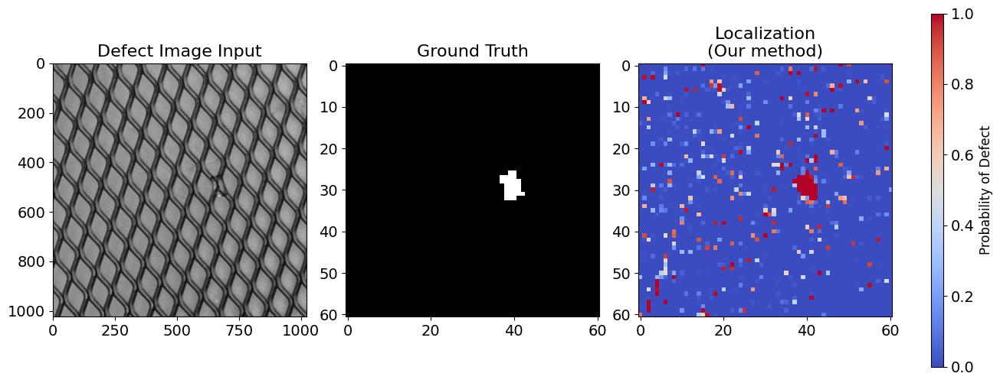

AUROC (Ours):  0.9753246753246754
AUPR (Ours):  0.6864082673108095
F1 score (Ours):  0.12602739726027395


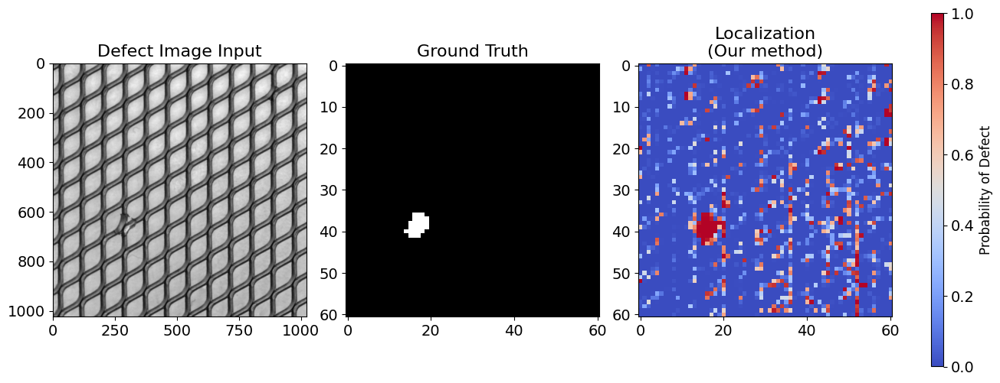

AUROC (Ours):  0.7935758603414389
AUPR (Ours):  0.37546838795858906
F1 score (Ours):  0.20408163265306123


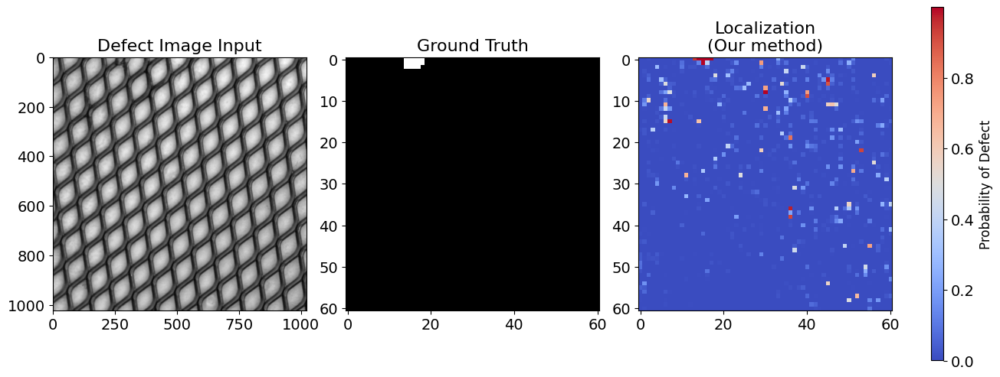

AUROC (Ours):  0.9212298310252827
AUPR (Ours):  0.29812293485369074
F1 score (Ours):  0.03188097768331562


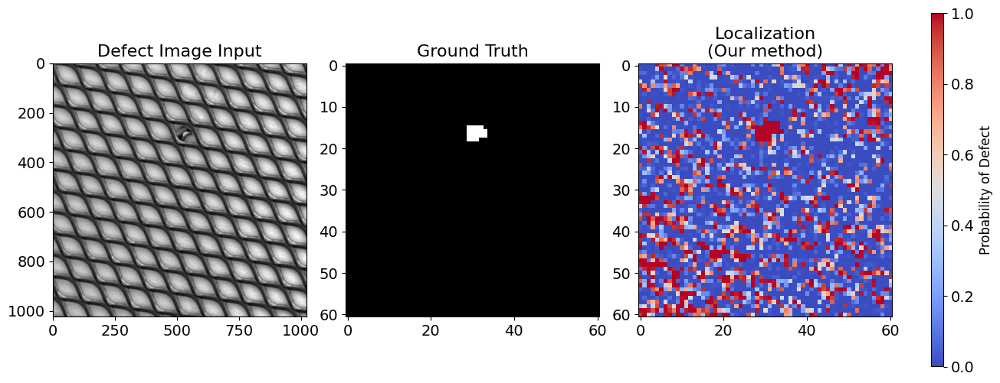

AUROC (Ours):  0.919855809766066
AUPR (Ours):  0.5294442311462577
F1 score (Ours):  0.3157894736842105


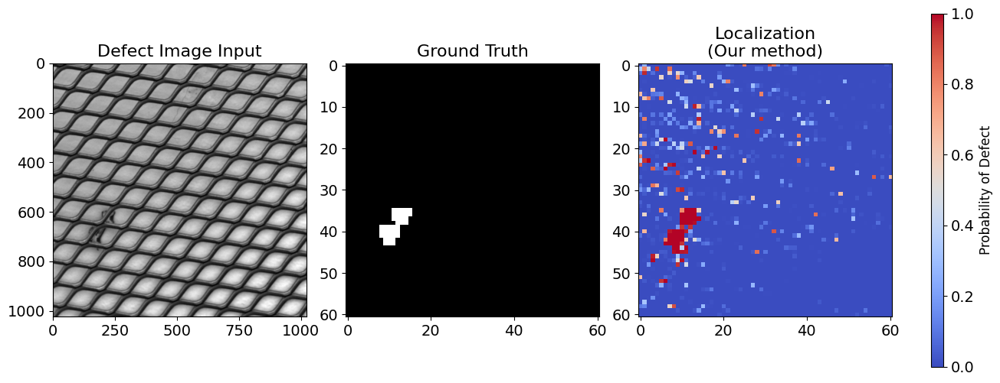

AUROC (Ours):  0.9150369713102633
AUPR (Ours):  0.623428211048066
F1 score (Ours):  0.41340782122905023


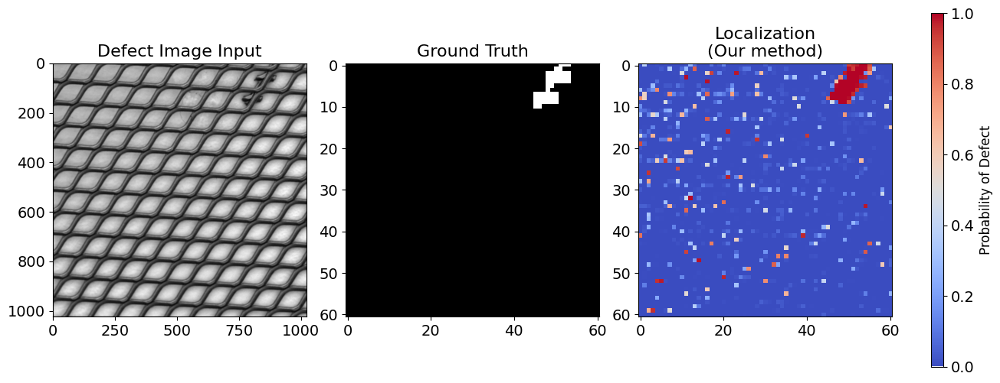

AUROC (Ours):  0.8486537938536851
AUPR (Ours):  0.2897146620776317
F1 score (Ours):  0.047708725674827375


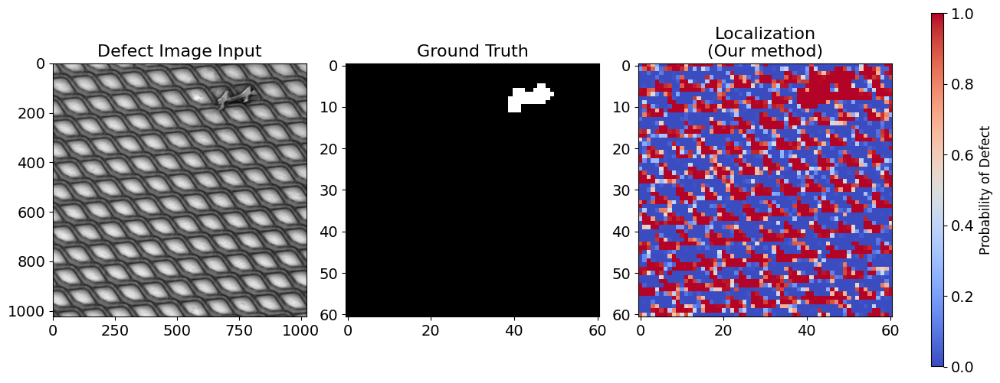

AUROC (Ours):  0.9625576036866359
AUPR (Ours):  0.6195239207698391
F1 score (Ours):  0.07462686567164178


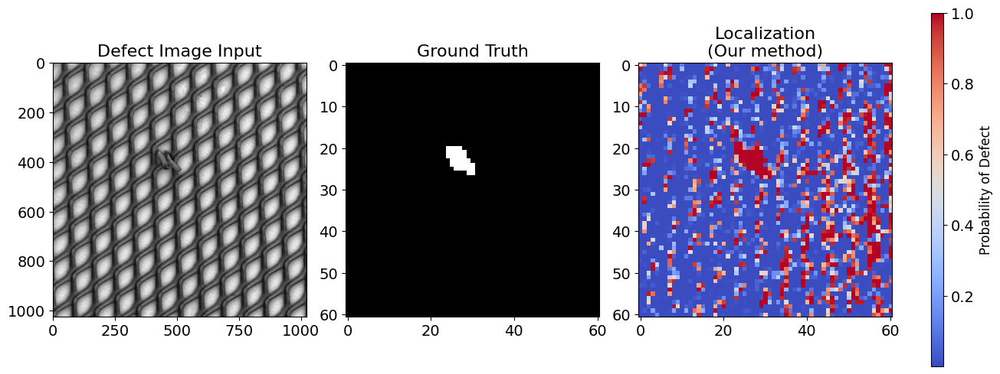

AUROC (Ours):  0.841554452112439
AUPR (Ours):  0.25219058599007005
F1 score (Ours):  0.09129332206255283


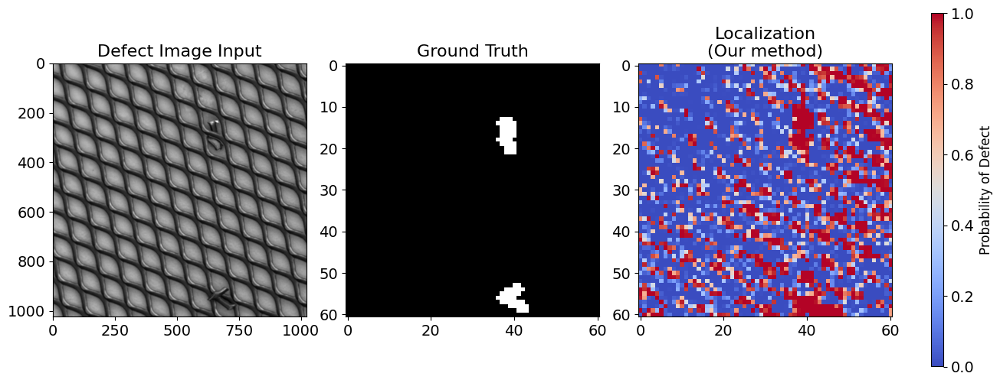

AUROC (Ours):  0.9318514508010989
AUPR (Ours):  0.31183581003732475
F1 score (Ours):  0.13127413127413126


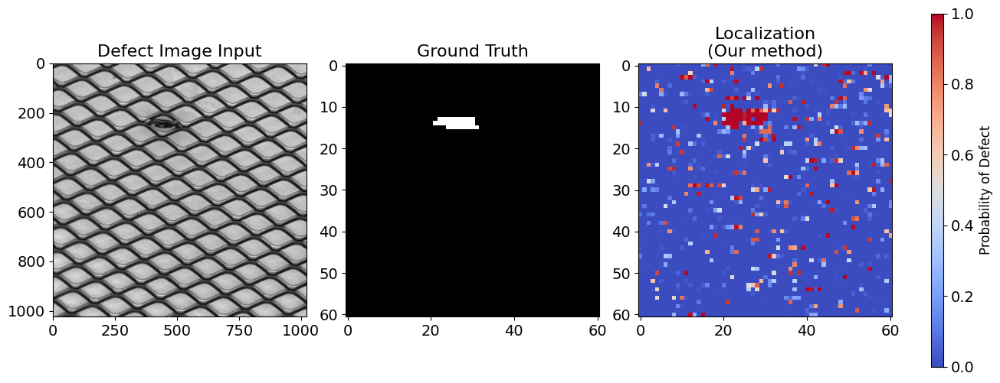

AUROC (Ours):  0.9898263123283432
AUPR (Ours):  0.7448638798637184
F1 score (Ours):  0.11065573770491802


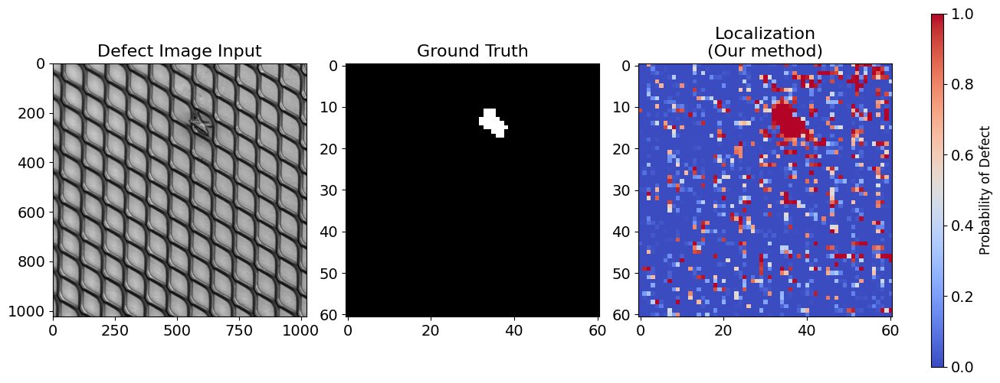

AUROC (Ours):  0.9643114961198339
AUPR (Ours):  0.7623629205126063
F1 score (Ours):  0.125


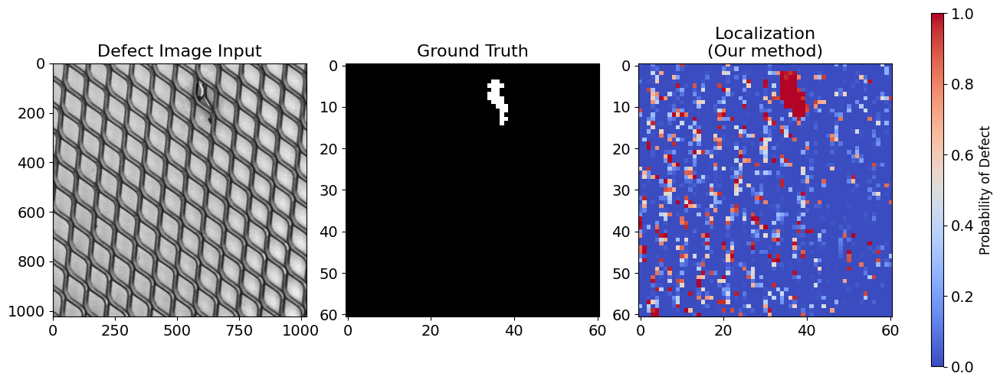

AUROC (Ours):  0.9356552937990793
AUPR (Ours):  0.5165210426980577
F1 score (Ours):  0.09124087591240876


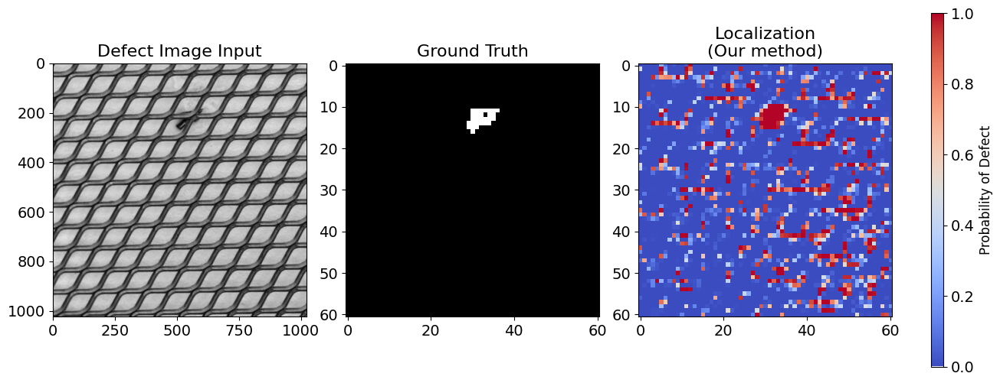

AUROC (Ours):  0.9680649705079672
AUPR (Ours):  0.6379254749124623
F1 score (Ours):  0.27705627705627706


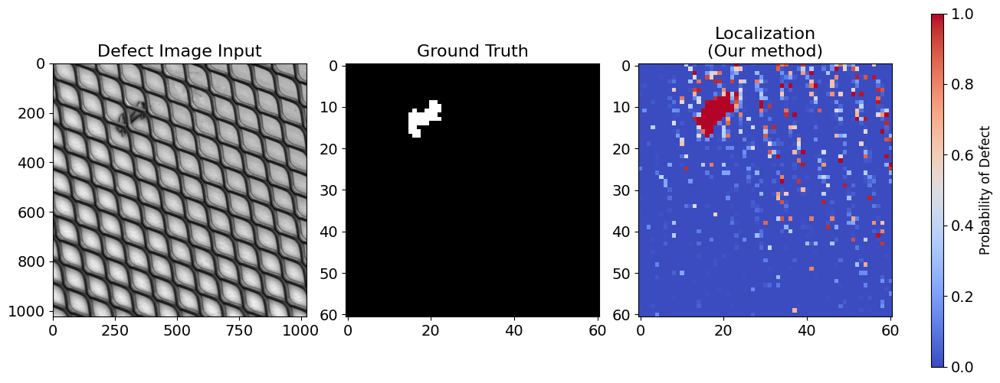

AUROC (Ours):  0.6295383062167514
AUPR (Ours):  0.26185486775472006
F1 score (Ours):  0.025632377740303542


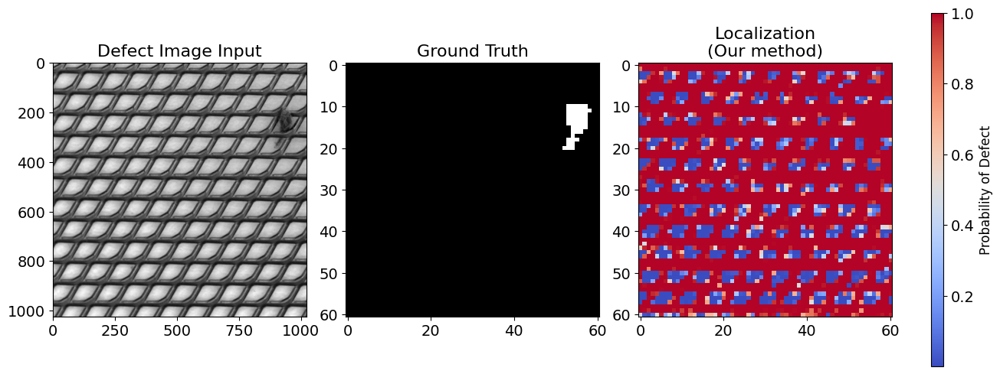

AUROC (Ours):  0.9647088247683235
AUPR (Ours):  0.6842297698165524
F1 score (Ours):  0.45512820512820507


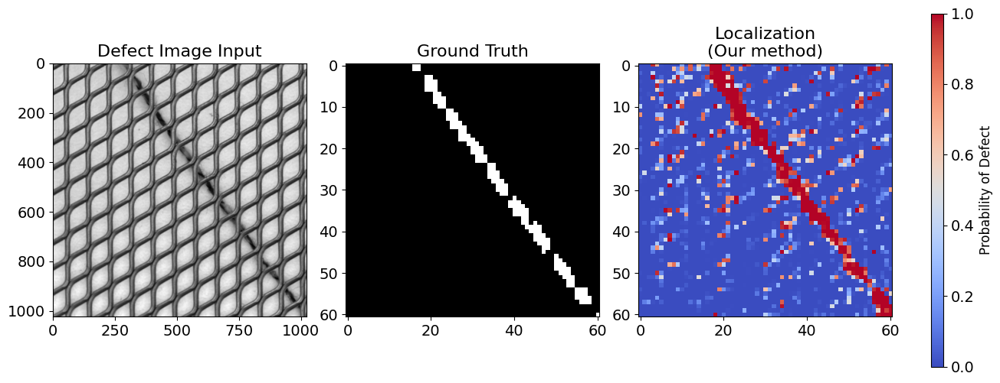

AUROC (Ours):  0.96557071055676
AUPR (Ours):  0.7367192428151531
F1 score (Ours):  0.5813953488372092


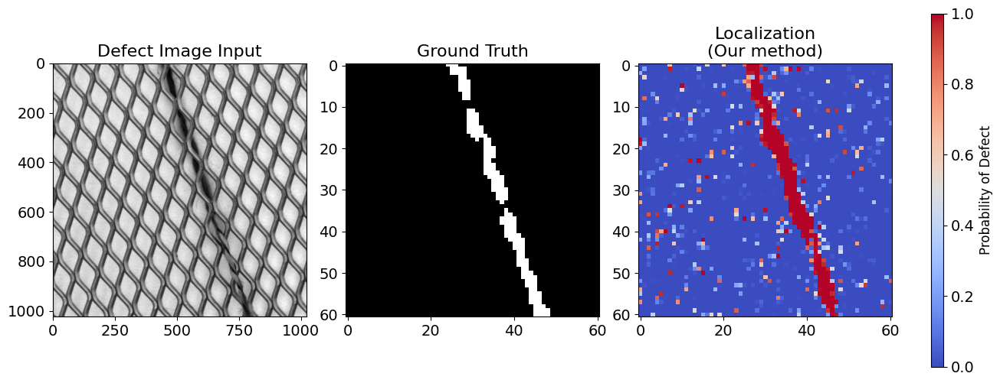

AUROC (Ours):  0.7280069457842948
AUPR (Ours):  0.09229084970083505
F1 score (Ours):  0.06011207335710647


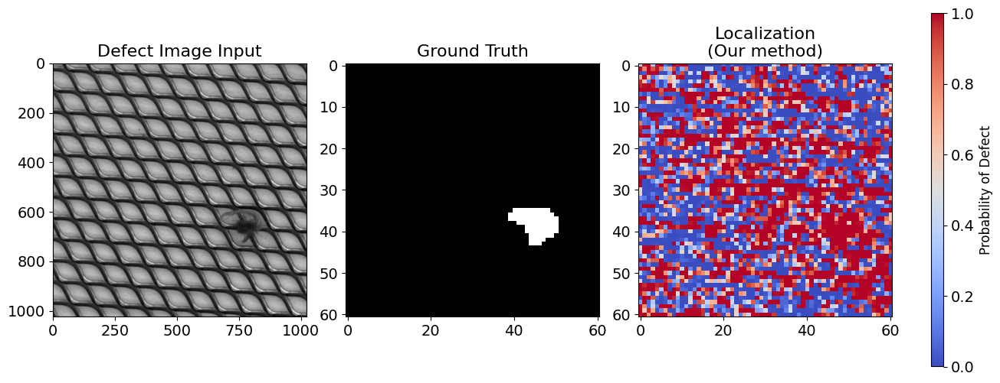

AUROC (Ours):  0.8593191842947225
AUPR (Ours):  0.2991140179087922
F1 score (Ours):  0.1756373937677054


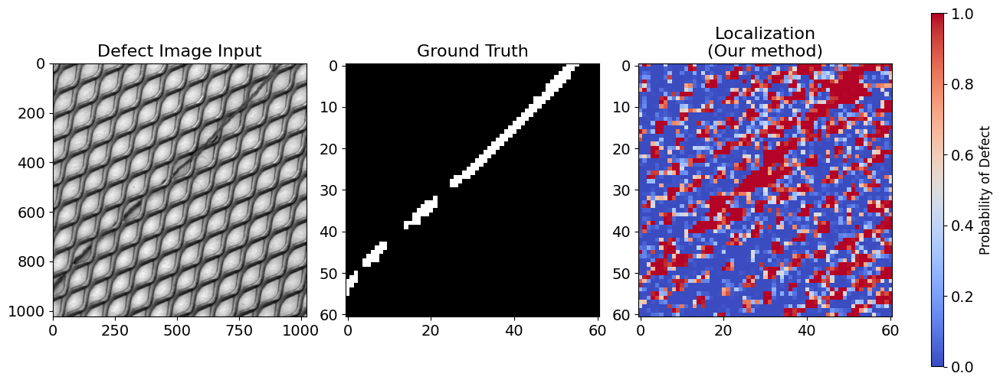

AUROC (Ours):  0.8503775019941752
AUPR (Ours):  0.209037313882637
F1 score (Ours):  0.18611309949892627


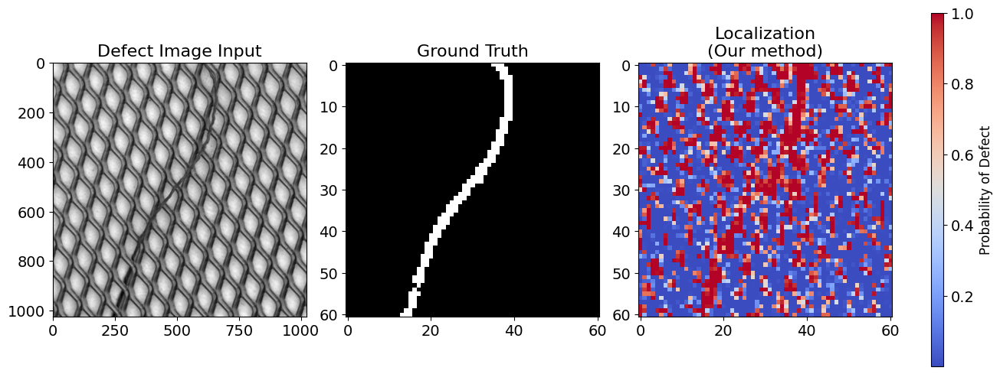

AUROC (Ours):  0.8179546200959915
AUPR (Ours):  0.2837702400004135
F1 score (Ours):  0.15965665236051502


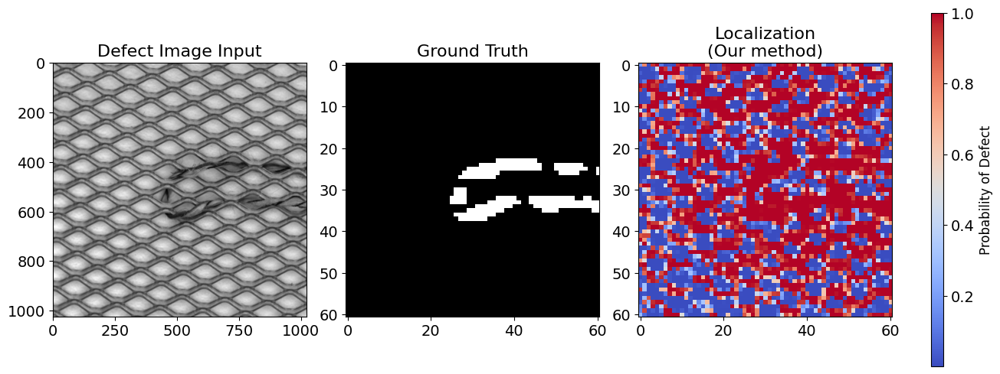

AUROC (Ours):  0.8207350638514593
AUPR (Ours):  0.234837081866346
F1 score (Ours):  0.10259238830667403


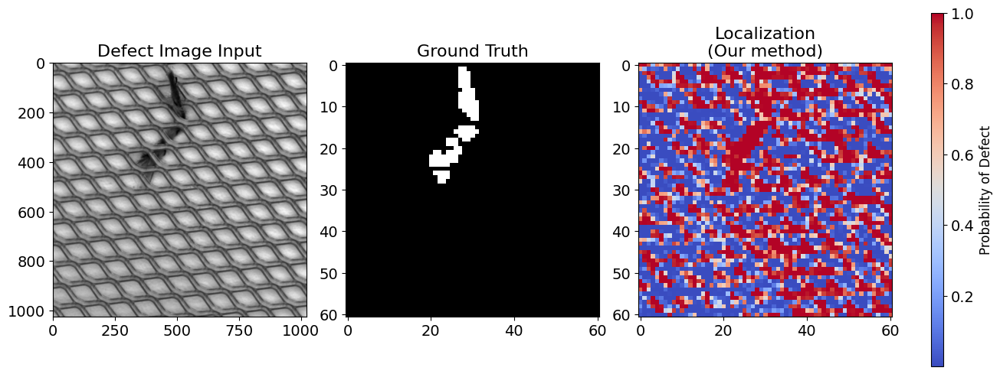

AUROC (Ours):  0.940223053860384
AUPR (Ours):  0.5624481361306621
F1 score (Ours):  0.20197044334975367


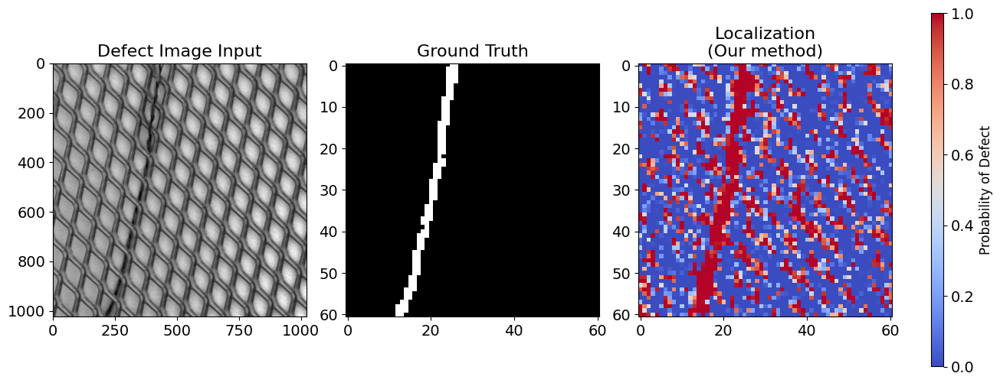

AUROC (Ours):  0.8017348586082511
AUPR (Ours):  0.25355026124210256
F1 score (Ours):  0.18752930145335206


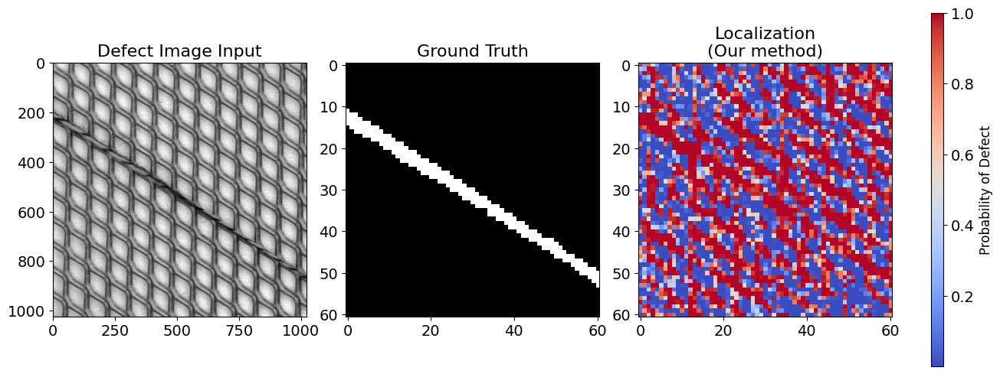

AUROC (Ours):  0.814601364285907
AUPR (Ours):  0.24692964250536303
F1 score (Ours):  0.19890510948905113


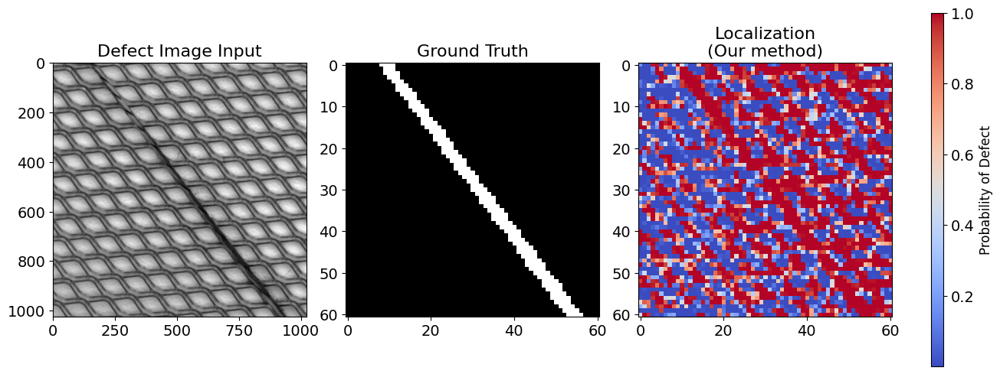

In [34]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# Plot real_def, masks, and processed_im
patch_size = (64, 64)  # replace with your desired patch size
overlap = 16  # replace with your desired overlap
for im_index in range(len(real_def)): #len(real_def)
    im = real_def[im_index]/255.0
    mask = masks[im_index]#/255.0
    #processed = processed_im[im_index]/255.0

    patches = view_as_windows(im, patch_size, step=overlap)

    # Apply the function to each patch
    processed = np.zeros((61,61))
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            class_pred, class_prob, _ = process_patch(patches[i, j])
            processed[i, j] = class_pred[0][1]
    # Plot the original, mask, and reconstructed images
    fig, ax = plt.subplots(1, 4, figsize=(15, 6),gridspec_kw={'width_ratios': [1, 1, 1, 0.05]})

    ax[0].imshow(im, cmap='gray')
    ax[0].set_title('Defect Image Input')  # Set title for the first plot
    ax[0].set_aspect('equal')  # Set aspect to be equal

    ax[1].imshow(mask, cmap='gray')  # New subplot for the mask
    ax[1].set_title('Ground Truth')  # Set title for the new plot
    ax[1].set_aspect('equal')  # Set aspect to be equal

    im2 = ax[2].imshow(processed, cmap='coolwarm')  # Use 'coolwarm' colormap
    ax[2].set_title('Localization\n(Our method)')  # Set title for the second plot
    ax[2].set_aspect('equal')  # Set aspect to be equal

    # im3 = ax[3].imshow(simplenetOUT[im_index], cmap='coolwarm')  # Use 'coolwarm' colormap
    # ax[3].set_title('Localization\n(SimpleNet)')  # Set title for the second plot
    # ax[3].set_aspect('equal')  # Set aspect to be equal

    cbar = fig.colorbar(im2, cax=ax[3])  # Add colorbar to the third subplot
    cbar.set_label('Probability of Defect', size=12)  # Increase font size of colorbar label
    
    # Calculate AUROC
    fpr, tpr, thresholds = roc_curve(mask.flatten(), processed.flatten())
    roc_auc = auc(fpr, tpr)
    auroc_cyclegan.append(roc_auc)
    print("AUROC (Ours): ", roc_auc)
    # Calculate AUPR
    precision, recall, thresholds = metrics.precision_recall_curve(mask.flatten(), processed.flatten())
    auc_pr = auc(recall, precision)
    auc_pr_cyclegan.append(auc_pr)
    print("AUPR (Ours): ", auc_pr)
    # Calculate F1 score
    f1_scores = f1_score(mask.flatten(), processed.flatten() > 0.5)
    f1_score_cyclegan.append(f1_scores)
    print("F1 score (Ours): ", f1_scores)

    # fpr, tpr, thresholds = roc_curve(mask.flatten(), simplenetOUT[im_index].flatten())
    # roc_auc = auc(fpr, tpr)
    # auroc_simplenet.append(roc_auc)
    # print("AUROC (SimpleNet): ", roc_auc)
    # # Calculate AUPR
    # precision, recall, thresholds = metrics.precision_recall_curve(mask.flatten(), simplenetOUT[im_index].flatten())
    # auc_pr = auc(recall, precision)
    # auc_pr_simplenet.append(auc_pr)
    # print("AUPR (SimpleNet): ", auc_pr)
    # # Calculate F1 score
    # f1_scores = f1_score(mask.flatten(), simplenetOUT[im_index].flatten() > 0.5)
    # f1_score_simplenet.append(f1_scores)
    # print("F1 score (SimpleNet): ", f1_scores)

    plt.show()
    fig.savefig('new_plot_{}.png'.format(im_index), bbox_inches='tight')
    plt.close(fig)

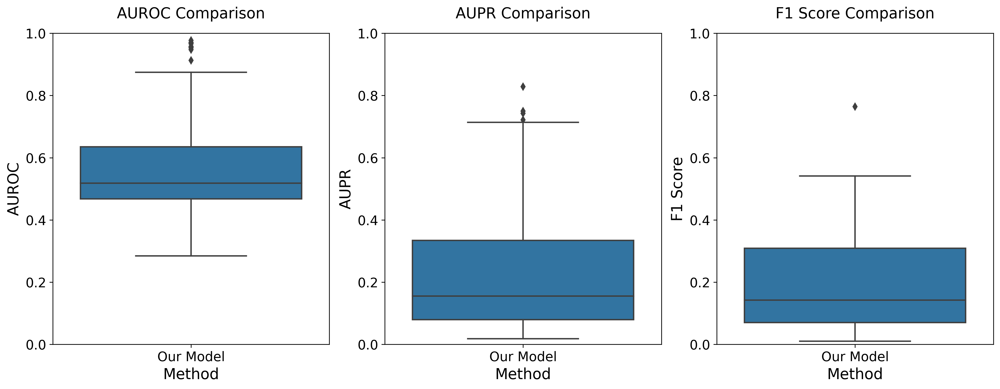

In [49]:
# Get Boxplot of auroc_cyclegan and auroc_simplenet
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['figure.titlesize'] = 16
mpl.rcParams['axes.titlepad'] = 16

# Get 3 subplots with model comparison of AUROC, AUPR, and F1 score using sns.boxplot
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].set_title('AUROC Comparison')
ax[1].set_title('AUPR Comparison')
ax[2].set_title('F1 Score Comparison')
ax[0].set_ylim([0, 1])
ax[1].set_ylim([0, 1])
ax[2].set_ylim([0, 1])
ax[0].set_ylabel('AUROC')
ax[1].set_ylabel('AUPR')
ax[2].set_ylabel('F1 Score')
ax[0].set_xlabel('Model')
ax[1].set_xlabel('Model')
ax[2].set_xlabel('Model')
ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel('')
df = pd.DataFrame({'F1 Score': f1_score_cyclegan + f1_score_simplenet, 'Method': ['Our Model']*len(f1_score_cyclegan) + ['SimpleNet']*len(f1_score_simplenet)})
sns.boxplot(x='Method', y='F1 Score', data=df, ax=ax[2])
df = pd.DataFrame({'AUROC': auroc_cyclegan + auroc_simplenet, 'Method': ['Our Model']*len(auroc_cyclegan) + ['SimpleNet']*len(auroc_simplenet)})
sns.boxplot(x='Method', y='AUROC', data=df, ax=ax[0])
df = pd.DataFrame({'AUPR': auc_pr_cyclegan + auc_pr_simplenet, 'Method': ['Our Model']*len(auc_pr_cyclegan) + ['SimpleNet']*len(auc_pr_simplenet)})
sns.boxplot(x='Method', y='AUPR', data=df, ax=ax[1])
plt.show()

In [35]:
np.mean(auroc_cyclegan)

0.9033194430299399

In [36]:
np.save('auroc_grid.npy', auroc_cyclegan)

In [37]:
np.median(auroc_cyclegan)

0.9318514508010989

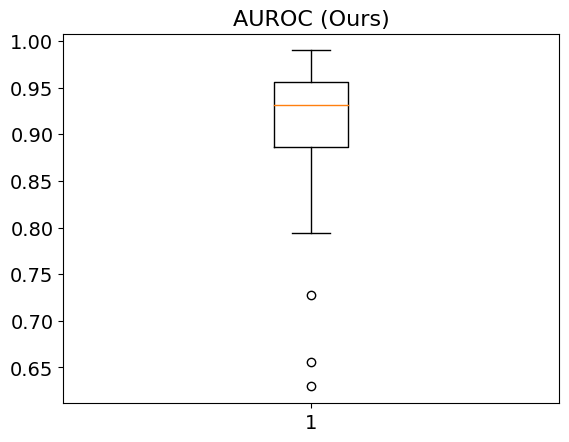

In [38]:
# boxplot of auroc_cyclegan
plt.boxplot(auroc_cyclegan)
plt.title('AUROC (Ours)')
plt.show()

In [ ]:
# Plot boxplots of F1 score for both methods
df = pd.DataFrame({'F1 Score': f1_score_cyclegan + f1_score_simplenet, 'Method': ['Ours']*len(f1_score_cyclegan) + ['SimpleNet']*len(f1_score_simplenet)})
sns.boxplot(x='Method', y='F1 Score', data=df)
plt.show()

In [ ]:
# plot boxplots of AUPR for both methods
df = pd.DataFrame({'AUPR': auc_pr_cyclegan + auc_pr_simplenet, 'Method': ['Ours']*len(auc_pr_cyclegan) + ['SimpleNet']*len(auc_pr_simplenet)})
sns.boxplot(x='Method', y='AUPR', data=df)
plt.show()

In [ ]:
#---------------------------------------------------------------------------------------------------------
# Select 15 samples from test data with labels as 1 (defects) and 15 samples with labels as 0 (no defects)
# With defects
Test_SHAP_samples_def = test_features_tensor[idx,:]
Test_SHAP_samples_ndef = test_features_tensor[nidx,:]

print(Test_SHAP_samples_def.unsqueeze(1).shape)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available

# Generate SHAP values for sample elements in test_image_vectors_reshaped
shap_values, indexes = deep_explainer.shap_values(
    Test_SHAP_samples_def.to(device).unsqueeze(1),  # Ensure tensor is on GPU
    ranked_outputs=num_classes,
    check_additivity=False
)

# Plot the summary plot
for arr in shap_values:
    x = arr.reshape(-1)  # Flatten the array
    T = Test_SHAP_samples_def.to(device).reshape(-1)  # Flatten the array
    shap.summary_plot(x, T, feature_names=None)  # Ensure tensor is on GPU

# Generate SHAP values for sample elements in test_image_vectors_reshaped
shap_values, indexes = deep_explainer.shap_values(
    Test_SHAP_samples_ndef.to(device).unsqueeze(1),  # Ensure tensor is on GPU
    ranked_outputs=num_classes,
    check_additivity=False
)

# Plot the summary plot
for arr in shap_values:
    x = arr.reshape(-1)  # Flatten the array
    T = Test_SHAP_samples_ndef.to(device).reshape(-1)  # Flatten the array
    shap.summary_plot(x, T, feature_names=None)  # Ensure tensor is on GPU

In [ ]:
# Save train_features_tensor and train_labels_tensor
torch.save(train_features_tensor, 'train_features_tensor.pth')
torch.save(train_labels_tensor, 'train_labels_tensor.pth')

# Save test_features_tensor and test_labels_tensor
torch.save(test_features_tensor, 'test_features_tensor.pth')
torch.save(test_labels_tensor, 'test_labels_tensor.pth')


## SHAP Analysis

In [ ]:
#Load the train and test tensors
train_features_tensor = torch.load('train_features_tensor.pth')
train_labels_tensor = torch.load('train_labels_tensor.pth')
test_features_tensor = torch.load('test_features_tensor.pth')
test_labels_tensor = torch.load('test_labels_tensor.pth')

In [ ]:
#Load the model
net = Net()
net.load_state_dict(torch.load('net.pth'))
net.eval()
#net.to(device)

In [ ]:
import os
import numpy as np
from PIL import Image
import shap
num_classes = 2

# Create a DeepExplainer using only 500 training data points
deep_explainer = shap.DeepExplainer(net, train_features_tensor.to(device).unsqueeze(1)[:500])

In [ ]:
train_features_tensor.unsqueeze(1)[:500].shape

In [ ]:
# Check class balance for first 500 samples in train labels
np.unique(train_labels_tensor[:500].numpy(), return_counts=True)

In [ ]:
test_labels_tensor
# Get 15 random indexes where test labels are 1
idx = np.random.choice(np.where(test_labels_tensor.cpu().numpy() == 1)[0], 10, replace=False)
nidx = np.random.choice(np.where(test_labels_tensor.cpu().numpy() == 0)[0], 10, replace=False)

In [ ]:
#---------------------------------------------------------------------------------------------------------
# Select 15 samples from test data with labels as 1 (defects) and 15 samples with labels as 0 (no defects)
# With defects
Test_SHAP_samples_def = test_features_tensor[idx,:]
Test_SHAP_samples_ndef = test_features_tensor[nidx,:]

print(Test_SHAP_samples_def.unsqueeze(1).shape)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use GPU if available

# Generate SHAP values for sample elements in test_image_vectors_reshaped
shap_values, indexes = deep_explainer.shap_values(
    Test_SHAP_samples_def.to(device).unsqueeze(1),  # Ensure tensor is on GPU
    ranked_outputs=num_classes,
    check_additivity=False
)

# Plot the summary plot
for arr in shap_values:
    x = arr.reshape(-1)  # Flatten the array
    T = Test_SHAP_samples_def.to(device).reshape(-1)  # Flatten the array
    shap.summary_plot(x, T, feature_names=None)  # Ensure tensor is on GPU

# Generate SHAP values for sample elements in test_image_vectors_reshaped
shap_values, indexes = deep_explainer.shap_values(
    Test_SHAP_samples_ndef.to(device).unsqueeze(1),  # Ensure tensor is on GPU
    ranked_outputs=num_classes,
    check_additivity=False
)

# Plot the summary plot
for arr in shap_values:
    x = arr.reshape(-1)  # Flatten the array
    T = Test_SHAP_samples_ndef.to(device).reshape(-1)  # Flatten the array
    shap.summary_plot(x, T, feature_names=None)  # Ensure tensor is on GPU